# Final project for mmn25
## Nastasia Klevak

In [73]:
import os
import numpy as np
import pandas as pd
import nibabel as nib
import nilearn
import json
import datetime
import pickle
import seaborn as sns
import gc
import psutil
import math
import scipy.stats as stats
from matplotlib.patches import Patch
from nilearn import plotting
from nilearn.glm.first_level import FirstLevelModel
from nilearn.glm.second_level import SecondLevelModel
from nilearn.glm import threshold_stats_img
from nilearn.image import concat_imgs, mean_img, index_img
from nilearn.reporting import make_glm_report
from nilearn import masking, image
from nilearn import datasets
from scipy.stats import pearsonr
import matplotlib.pyplot as plt
from collections import defaultdict

In [74]:
# where the second level models are stored:
INPUT_DIR = '/home/users/nklevak/network_data_updated/'

# Yeo network information
# download Yeo atlas
yeo = datasets.fetch_atlas_yeo_2011()
yeo_7network = yeo['thick_7'] 
yeo_atlas_nifti = nib.load(yeo_7network)
if yeo_atlas_nifti.get_fdata().ndim == 4:
    yeo_data_3d = yeo_atlas_nifti.get_fdata().squeeze()
    yeo_atlas_3d = nib.Nifti1Image(yeo_data_3d, yeo_atlas_nifti.affine, yeo_atlas_nifti.header)
    print(f"Fixed shape: {yeo_atlas_3d.shape}")
else:
    yeo_atlas_3d = yeo_atlas_nifti

network_names = {
    1: "Visual",
    2: "Somatomotor",
    3: "Dorsal Attention",
    4: "Ventral Attention",
    5: "Limbic",
    6: "Frontoparietal Control",
    7: "Default Mode"
}

# relevant task and contrast data
TASKS = ["nBack","flanker","directedForgetting","goNogo", "shapeMatching", "stopSignal", "cuedTS", "spatialTS"]
CONTRASTS = {}
CONTRASTS["nBack"] = ["twoBack-oneBack", "match-mismatch","task-baseline","response_time"] # the nback contrasts
CONTRASTS["flanker"] = ["incongruent-congruent", "task-baseline", "incongruent-congruent","response_time"]
CONTRASTS["directedForgetting"] = ["neg-con", "task-baseline","response_time"]
CONTRASTS["goNogo"] = ["nogo_success-go", "nogo_success","task-baseline","response_time"] # go_rtModel check
CONTRASTS["shapeMatching"] = ["DDD", "DDS", "DNN", "DSD", "main_vars", "SDD", "SNN", "SSS", "task-baseline","response_time"]
CONTRASTS["stopSignal"] = ["go", "stop_failure-go", "stop_failure", "stop_failure-stop_success", "stop_success-go", "stop_success", "stop_success-stop_failure", "task-baseline","response_time"]
CONTRASTS["cuedTS"] = ["cue_switch_cost", "task_switch_cost", "task_switch_cue_switch-task_stay_cue_stay", "task-baseline","response_time"]
CONTRASTS["spatialTS"] = ["cue_switch_cost", "task_switch_cost", "task_switch_cue_switch-task_stay_cue_stay", "task-baseline","response_time"]

# number of encounters each subject has with a task
max_num_encounters = 5

[get_dataset_dir] Dataset found in /home/users/nklevak/nilearn_data/yeo_2011

Fixed shape: (256, 256, 256)


In [75]:
# variables relevent to the first level models / creating the second level models:

# where the first level models are stored
BASE_DIR = '/oak/stanford/groups/russpold/data/network_grant/discovery_BIDS_20250402/derivatives/'
LEVEL = 'output_lev1_mni_no_ted_comp'

# information on the subjects in the discovery sample are stored
SUBJECTS = ['sub-s03', 'sub-s10', 'sub-s19', 'sub-s29', 'sub-s43']
SESSIONS = ['ses-01', 'ses-02', 'ses-03', 'ses-04', 'ses-05', 'ses-06', 'ses-07', 'ses-08', 'ses-09','ses-10']

# Introduction:

### Background context: 

For the final project, I am using some of the techniques learned in this class on part of a Poldrack lab dataset--called the Network dataset. In this dataset, 54 participants came in for 10 sessions over several months. In each session, they were given some of several tasks to do. These tasks were: nBack, flanker, directed forgetting, goNogo, shape matching, stop signal, cued task switching, and spatial task switching. While they did not do every task every session, each subject did every single task during 5 out of their 10 sessions. So, per task/subject there are 5 sessions.

For the analyses in this notebook, I will be using a discovery sample of 5 subjects, with all of their task data/sessions. I am using this sample to better understand **what might be going on in the data across time, as participants learn and practice the same task over and over again.** After gaining an understanding of potential patterns in the data resulting from practicing/learning the tasks, I plan to develop and pre-register clear hypotheses and further analyses for the full participant sample.

### Question(s) and methods:

The central question of this project is to begin to understand **how participant's neural activations at specific tasks change over time, potentially reflecting a change in strategy or automaticity as they better learn the tasks.** For example, it is possible that there will be decreased activation in control areas/networks when tasks become more automatic, or that there may be changes in which networks are primarily activated as a result of changing task strategies.

To begin exploring this question, we will take pre-created individual-subject, individual-session brain maps based upon general linear models (GLMs). These standardized effect size maps exist for each subject/session/task combination, for several different contrasts specific to the task. They are all in MNI space, and will be refered to as **first level maps**. We will then use the entire maps as well as specific Yeo networks within these maps to create RSA matrices for each task/contrast pair within each specified brain region (whole brain or the individual Yeo networks). From this, we will answer:
1) **Are subjects more correlated with themselves than with other subjects? How consistent is this pattern across regions, tasks, and contrasts?**
    - If subjects in the whole brain data are not more correlated with themselves than other subjects, this could indicate an issue with noise or movement.
    - However, if it is not the case in all of the networks, it could suggest that some additional changes are occuring in those networks over time.
2) **In each of the Yeo networks and the whole brain, are subjects more correlated with themselves during other encounters of a given task/contrast, or with other subjects in the same encounter?** Encounters will be further described later, but in this project an encounter is defined as the number of times a subject has partaken in a given task.
    - If subjects are less similar to themselves across encounters than to others in the same encounter of a task/contrast, it may support the idea that there are time effects going on, and may point towards which specific networks are changing the most.
3) **In each of the Yeo networks and the whole brain, how does the mean correlation between subjects in the same task/contrast/encounter number change across encounters. Do participants tend to get more or less similar to each other as they learn/practice the task?**
    - If participants get more similar, it may indicate converging strategies or more efficient activation patterns.
    - By looking at this in specific networks as well as the whole brain, we can get an idea of which network activations may be changing the most.

By conducting these analyses using RSMs, we can begin to understand where in the brain, if any, time effects are occuring when participants do the same tasks many times.

# Useful functions:

These functions will be used later on in this notebook to assist in the process of calculating the RSMs, which takes up a lot of memory, saving them in a file, loading them into a variable, and also cleaning memory.

In [76]:
def save_rsm(rsm_results, filename):
    """
    Simple save function
    
    Parameters:
        rsm_results: RSM results dictionary
        filename: filename to save (will add .pkl automatically)
    """
    if not filename.endswith('.pkl'):
        filename += '.pkl'
    
    with open(filename, 'wb') as f:
        pickle.dump(rsm_results, f)
    
    file_size = os.path.getsize(filename) / (1024 * 1024)
    print(f"Saved to {filename} ({file_size:.1f} MB)")

def load_rsm(filename):
    """
    Simple load function
    
    Parameters:
        filename: filename to load
    
    Returns:
        rsm_results: Loaded RSM dictionary
    """
    if not filename.endswith('.pkl'):
        filename += '.pkl'
    
    with open(filename, 'rb') as f:
        rsm_results = pickle.load(f)
    
    print(f"Loaded from {filename}")
    return rsm_results

def cleanup_memory():
    """
    Clean up memory between batches
    """
    # Force garbage collection
    gc.collect()
    
    # Get memory info
    memory = psutil.virtual_memory()
    print(f"Memory after cleanup: {memory.percent:.1f}% used ({memory.available/(1024**3):.1f}GB available)")


# Section 0: load in the relevant data 

In this project we will use first level models.

Here, the first level models are task contrast maps per individual subject per session/encounter number with the given task. To define encounter number, it is important to note that each subject was scanned 10 times, and--of those 10 sessions--had 5 experiences with each of the tasks. So, we have the objective session number of each scan as well as the encounter number (i.e. how many times the subject has seen this task so far). 

In [77]:
# load first level zmap filepaths for all tasks and contrasts
all_contrast_maps = {} # keep track of all zmaps per task per contrast per subject; task -> contrast -> subject -> list of maps for all sessions
encounter_maps = {} # keep track of each subjects encounter number; [task][contrast_name][subject][overall_encounter_count] -> one map each

for task in TASKS:
    encounter_maps[task]={}
    all_contrast_maps[task] = {}
    
    for contrast_name in CONTRASTS[task]:
        encounter_maps[task][contrast_name] = {}
        all_contrast_maps[task][contrast_name] = {}
        
        # save the first level contrast map files
        for subject in SUBJECTS:
            overall_encounter_count = 0
            encounter_maps[task][contrast_name][subject] = {}
            all_contrast_maps[task][contrast_name][subject] = []

            # overall_session_count = 0
            for session in SESSIONS:
                # Path to contrast image from first-level analysis
                contrast_map_path = os.path.join(
                    BASE_DIR, LEVEL, subject, task, 'indiv_contrasts', f'{subject}_{session}_task-{task}_contrast-{contrast_name}_rtmodel-rt_centered_stat-effect-size.nii.gz'
                )
                
                # Check if file exists before adding
                if os.path.exists(contrast_map_path):
                    all_contrast_maps[task][contrast_name][subject].append(contrast_map_path)
                    
                    encounter_maps[task][contrast_name][subject][overall_encounter_count] = contrast_map_path
                    overall_encounter_count += 1

# rename to properly keep track of which ones are first level maps
first_level_session_maps = all_contrast_maps
first_level_encounter_maps = encounter_maps

The first level contrast filepath maps are loaded.

# Section 1: using RSMs from first level contrast maps to understand within-subject vs between-subject activation correlations

Using the first level maps, we will answer and explore the first two questions:

1) Are subjects more correlated with themselves than with other subjects? How consistent is this pattern across regions, tasks, and contrasts?
2) In each of the Yeo networks and the whole brain, are subjects more correlated with themselves during other encounters of a given task/contrast, or with other subjects in the same encounter?

### Generating the RSA matrices

To begin, we will need to gather the relevant maps for each task/contrast combination.

In [78]:
# function to gather maps of a certain task/contrast from first_level_encounter_maps
def gather_tc_maps(req_tasks,req_contrasts,all_maps=first_level_encounter_maps,req_encounters=[0,1,2,3,4], req_subjects = SUBJECTS):
    '''
    Get a list of loaded niftis for specific task/contrast/encounter combinations of first level maps 
    
    Parameters
        req_tasks: list of tasks as strings (all tasks have to be from the TASKS dict)
        req_contrasts: list of contrasts as strings (all tasks have to be from the CONTRASTS dict)
        all_maps: [task][contrast_name][subject][overall_encounter_count] -> one map each (here it is in a filepath format)
        req_encounters: list of encounter numbers that are requested (default is all 5)
        req_subjects: list of subject id strings that are requested (default is all in SUBJECTS)
    Return
        specified_maps: list of loaded nifti files that fit the requested task, contrast, and encounter (this returns this for all subjects)
        specified_descriptors: list of descriptions of each file (i.e. titles)
        data_title: informative title for the RSM that will later be created
    
    '''
    specified_maps = []
    specified_descriptors = []
    max_num_encounters = 5

    if (len(req_tasks) == 0) or (len(req_contrasts) == 0):
        return [], [], ''

    for task in req_tasks:
        if task not in TASKS:
            print(f"task {task} not in task masterlist")
            continue
    
        for contrast in req_contrasts:
            if contrast not in CONTRASTS[task]: # make sure this contrast exists in the given task
                print(f"skipped for contrast {contrast} and task {task}")
                continue
                
            for subject in req_subjects:
                if subject not in SUBJECTS:
                    print(f"subject: {subject} is not in this dataset, so skipped")
                    continue
                    
                for encounter in req_encounters:
                    if encounter < 0 or encounter >= max_num_encounters:
                        continue

                    descriptor_name = f"{subject}:encounter-0{encounter + 1}"
                            
                    if task in all_maps.keys():
                        if contrast in all_maps[task].keys():
                            if subject in all_maps[task][contrast].keys():
                                if encounter in all_maps[task][contrast][subject].keys():

                                    map_data = all_maps[task][contrast][subject][encounter]
                                    
                                    # Check if file is already loaded
                                    if isinstance(map_data, str):
                                        # map_data is a file path, need to load it
                                        try:
                                            if os.path.exists(map_data):
                                                loaded_map = nib.load(map_data)
                                                specified_maps.append(loaded_map)
                                                specified_descriptors.append(descriptor_name)
                                            else:
                                                print(f"File not found: {map_data}")
                                                failed_loads.append((descriptor_name, "File not found"))
                                        except Exception as e:
                                            print(f"Error loading {map_data}: {str(e)}")
                                    else:
                                        print(f"Unexpected data type for {descriptor_name}: {type(map_data)}")
                                        
                                else:
                                    print(f"{task}|{contrast}|{subject}: {encounter}")
                                    continue
                            else:
                                print(f"{task}|{contrast} subject {subject}")
                                continue
                        else:
                            print(f"{task}:{contrast}")
                            continue
                    else:
                        print(f"{task}")
                        continue
    # create RSM title
    data_title = ''
    if (len(req_tasks) == 1):
        data_title += f'Task:{req_tasks[0]}|'
    else:  # more than 1 task
        data_title += 'Task:'
        for i, task in enumerate(req_tasks):
            if (i != len(req_tasks) - 1):
                data_title += f"{task},"
            else:
                data_title += f"{task}"
        data_title += '|'

    if (len(req_contrasts) == 1):
        data_title += f'Contrast:{req_contrasts[0]}'
    else:
        data_title += 'Contrast:'
        for i, contrast in enumerate(req_contrasts):
            if (i != (len(req_contrasts) - 1)):
                data_title += f"{contrast},"
            else:
                data_title += f"{contrast}"
    
    return specified_maps, specified_descriptors, data_title

Now, for every possible task/contrast combination, we will gather the relevant maps, descriptors, and title to feed into the RSM creation function later on.

In [79]:
task_contrast_all_maps = {}
not_included = {}
print("MISSING:") # to see what maps are missing
for task in TASKS:
    task_contrast_all_maps[task] = {}
    for contrast in CONTRASTS[task]:
        task_contrast_all_maps[task][contrast] = {}
        task_contrast_all_maps[task][contrast]["maps_list"] = []
        task_contrast_all_maps[task][contrast]["descriptors_list"] = []
        task_contrast_all_maps[task][contrast]["data_title"] = ""

        req_tasks = [task]
        req_contrasts = [contrast]

        task_contrast_all_maps[task][contrast]["maps_list"],task_contrast_all_maps[task][contrast]["descriptors_list"],task_contrast_all_maps[task][contrast]["data_title"] = gather_tc_maps(req_tasks,req_contrasts,all_maps=first_level_encounter_maps,req_encounters=[0,1,2,3,4], req_subjects = SUBJECTS)

        # print(f"{task},{contrast}, maps added")
        

MISSING:
goNogo|nogo_success-go|sub-s19: 4
goNogo|nogo_success-go|sub-s29: 4
goNogo|nogo_success-go|sub-s43: 4
goNogo|nogo_success|sub-s19: 4
goNogo|nogo_success|sub-s29: 4
goNogo|nogo_success|sub-s43: 4
goNogo|task-baseline|sub-s19: 4
goNogo|task-baseline|sub-s29: 4
goNogo|task-baseline|sub-s43: 4
goNogo|response_time|sub-s19: 4
goNogo|response_time|sub-s29: 4
goNogo|response_time|sub-s43: 4
cuedTS|cue_switch_cost|sub-s29: 4
cuedTS|task_switch_cost|sub-s29: 4
cuedTS|task_switch_cue_switch-task_stay_cue_stay|sub-s29: 4
cuedTS|task-baseline|sub-s29: 4
cuedTS|response_time|sub-s29: 4


Several of these task/contrast pairings do not have all 5 encounters. 

So, *cuedTS* and *goNogo* may have a little less data than the others for the last encounter (important for us to keep in mind).

Using these organized maps for each task,contrast pairing, we will now generate an RSM for every combination. This will be done for the whole brain, as well as for each Yeo network.

To do this for the Yeo networks, we have to resample the Yeo dataset to be the same size as our maps.

In [80]:
def resample_atlas(reference_map_object, yeo_atlas_data=yeo_atlas_3d):
    """
    Resample atlas to match reference map
    
    Parameters:
        reference_map_object: loaded NIfTI object to use as reference
        yeo_atlas_data: loaded Yeo atlas
    
    Returns:
        resampled_atlas: resampled atlas ready for use
    """
    # Load reference if it's a path    
    print(f"Reference shape: {reference_map_object.shape}")
    print(f"Atlas original shape: {yeo_atlas_data.shape}")
    
    # Resample atlas
    yeo_resampled = nilearn.image.resample_to_img(
        yeo_atlas_data, 
        reference_map_object, 
        interpolation='nearest',
        force_resample=True
    )
    
    print(f"Atlas resampled shape: {yeo_resampled.shape}")
    return yeo_resampled

# Get a reference map (use the first map from first task/contrast combination)
def get_reference_map(task_contrast_all_maps=task_contrast_all_maps):
    """Get a reference map for resampling"""
    for task in task_contrast_all_maps:
        for contrast in task_contrast_all_maps[task]:
            if len(task_contrast_all_maps[task][contrast]["maps_list"]) > 0:
                reference_map = task_contrast_all_maps[task][contrast]["maps_list"][0]
                print(f"Using reference map from {task}, {contrast}")
                return reference_map
    return None

In [81]:
# resample the atlas
print("Resampling atlas:")
reference_map = get_reference_map()
if reference_map is None:
    print("Error: No reference map found")
else:
    yeo_atlas_resampled = resample_atlas(reference_map,yeo_atlas_3d)
    print("resampling complete!")


Resampling atlas:
Using reference map from nBack, twoBack-oneBack
Reference shape: (97, 115, 97)
Atlas original shape: (256, 256, 256)


/home/users/nklevak/miniconda3/lib/python3.9/site-packages/nilearn/image/resampling.py:805: FutureWarning: From release 0.13.0 onwards, this function will, by default, copy the header of the input image to the output. Currently, the header is reset to the default Nifti1Header. To suppress this warning and use the new behavior, set `copy_header=True`.
  return resample_img(


Atlas resampled shape: (97, 115, 97)
resampling complete!


Now that we resampled it, we can pass it into the function below. In this function, we will compute an RSM for each task/contrast combination and for each region (whole brain, all the Yeo networks).

In [82]:
# Pattern-based RSM computation for all networks and whole brain
def compute_rsms(specified_maps, specified_descriptors, data_title, 
                              yeo_atlas_data=yeo_atlas_resampled, network_names=network_names, 
                              correlation_metric='pearson'):
    '''
    RSM computation using full voxel patterns for all networks and whole brain
    
    Parameters:
        specified_maps: list of loaded nifti files
        specified_descriptors: list of descriptions for each map 
        data_title: title for the RSM
        yeo_atlas_data: resampled and loaded Yeo atlas (default yeo_atlas_resampled)
        network_names: dictionary mapping network numbers to names
        correlation_metric: 'pearson', 'spearman', or 'cosine'
        include_whole_brain: whether to include whole brain RSM
    '''
    if len(specified_maps) == 0:
        print("No maps provided for RSM computation")
        return {}, [], []
    
    # Get reference image for resampling
    reference_img = specified_maps[0]
    # print(f"Reference image shape: {reference_img.shape}")
    
    # Use pre-resampled atlas
    if yeo_atlas_data is not None:
        if hasattr(yeo_atlas_data, 'get_fdata'):
            yeo_data = yeo_atlas_data.get_fdata()
            print(f"Using pre-resampled Yeo atlas shape: {yeo_data.shape}")
        else:
            yeo_data = yeo_atlas_data
            print(f"Using Yeo atlas array with shape: {yeo_data.shape}")
    else:
        print("Error: yeo_atlas_data is None")
        return {}, [], []
    
    # Get network labels and make the names
    network_labels = np.unique(yeo_data[yeo_data > 0])
    network_labels = [int(label) for label in network_labels]
    print(f"Found {len(network_labels)} networks: {network_labels}")
    network_labels_named = [f"{label}_{network_names.get(label, f'Network{label}')}" 
                               for label in network_labels]
    print(f"Network names: {network_labels_named}")
    
    # Convert maps to data arrays and extract data for each network
    n_maps = len(specified_maps)
    
    # Initialize storage for network data
    network_data = {}
    
    # Add whole brain
    network_data['whole_brain'] = []
    
    # Initialize network data storage
    for i, network in enumerate(network_labels):
        network_key = network_labels_named[i]
        network_data[network_key] = []
    
    # Extract data from each map
    for i, nifti_map in enumerate(specified_maps):
        try:
            # Get map data
            if hasattr(nifti_map, 'get_fdata'):
                map_data = nifti_map.get_fdata()
            else:
                map_data = nifti_map
            
            # Check shape alignment
            if map_data.shape != yeo_data.shape:
                print(f"Warning: Map {i} shape {map_data.shape} doesn't match atlas shape {yeo_data.shape}")
                continue
            
            # Extract whole brain data
            brain_mask = (yeo_data > 0) & (~np.isnan(map_data))
            whole_brain_values = map_data[brain_mask]
            network_data['whole_brain'].append(whole_brain_values)
            
            # Extract full activation patterns for each network
            for j, network in enumerate(network_labels):
                network_key = network_labels_named[j]
                network_mask = (yeo_data == network) & (~np.isnan(map_data))
                network_values = map_data[network_mask]
                
                if len(network_values) > 0:
                    # Store FULL activation pattern for this network
                    network_data[network_key].append(network_values)
                else:
                    # Store empty array for missing data
                    network_data[network_key].append(np.array([]))
                        
        except Exception as e:
            print(f"Error processing map {i} ({specified_descriptors[i]}): {e}")
            continue
    
    # Compute RSMs
    rsm_results = {}
    
    for region_name, region_data in network_data.items():
        if len(region_data) != n_maps:
            print(f"Warning: {region_name} has {len(region_data)} values, expected {n_maps}")
            continue
            
        try:
            # correlate full activation patterns
            rsm_matrix = np.zeros((n_maps, n_maps))
            
            for i in range(n_maps):
                for j in range(n_maps):
                    if i <= j:  # symmetric matrix
                        
                        # Handle empty arrays
                        if len(region_data[i]) == 0 or len(region_data[j]) == 0:
                            corr = 0.0
                        else:
                            if correlation_metric == 'pearson':
                                corr, _ = pearsonr(region_data[i].flatten(), 
                                                 region_data[j].flatten())
                            elif correlation_metric == 'spearman':
                                corr, _ = spearmanr(region_data[i].flatten(), 
                                                  region_data[j].flatten())
                            elif correlation_metric == 'cosine':
                                dot_product = np.dot(region_data[i].flatten(), 
                                                   region_data[j].flatten())
                                norm_i = np.linalg.norm(region_data[i].flatten())
                                norm_j = np.linalg.norm(region_data[j].flatten())
                                corr = dot_product / (norm_i * norm_j) if (norm_i * norm_j) > 0 else 0
                        
                        rsm_matrix[i, j] = corr
                        rsm_matrix[j, i] = corr 
            
            # Handle NaNs
            rsm_matrix = np.nan_to_num(rsm_matrix, nan=0.0)
            
            # Calculate network size
            if region_name == 'whole_brain':
                n_voxels = len(region_data[0]) if len(region_data) > 0 and len(region_data[0]) > 0 else 0
            else:
                network_num = int(region_name.split('_')[0])
                n_voxels = int(np.sum(yeo_data == network_num))
            
            rsm_results[region_name] = {
                'rsm': rsm_matrix,
                'n_voxels': n_voxels,
                'analysis_type': 'pattern',
                'network_name': region_name,
                'full_title': data_title +'|'+ region_name,
                'descriptors': specified_descriptors
            }
            
        except Exception as e:
            print(f"Error computing RSM for {region_name}: {e}")
            continue
    
    print(f"Successfully computed pattern-based RSMs for {len(rsm_results)} regions")
    return rsm_results, network_labels_named, specified_descriptors

If the rsms haven't all been saved already, calculate them all in batches. This must be batched due to memory constraints.

In [83]:
first_batch_tasks = ["nBack","flanker","directedForgetting"]
second_batch_tasks = ["goNogo", "shapeMatching", "stopSignal"]
third_batch_tasks = [ "cuedTS", "spatialTS"]

# calculate batch 1 if necessary
if os.path.exists("first_batch_rsm.pkl") or os.path.exists("complete_rsm_results.pkl"):
    print("File exists!")
    
else:
    print("File not found...calculating now")
    rsm_results_all = {}
    for task in task_contrast_all_maps:
        rsm_results_all[task] = {}
        
        if task not in first_batch_tasks:
            continue
            
        for contrast in task_contrast_all_maps[task]:
            if len(task_contrast_all_maps[task][contrast]["maps_list"]) > 0:
                rsm_results, network_labels, descriptors = compute_rsms(
                    specified_maps=task_contrast_all_maps[task][contrast]["maps_list"],
                    specified_descriptors=task_contrast_all_maps[task][contrast]["descriptors_list"],
                    data_title=task_contrast_all_maps[task][contrast]["data_title"],
                )
                rsm_results_all[task][contrast] = rsm_results

    # save first batch srm
    save_rsm(rsm_results_all, "first_batch_rsm")
    
    del rsm_results_all  # Delete the large dictionary
    cleanup_memory()

# calculate batch 2 if necessary
if os.path.exists("second_batch_rsm.pkl") or os.path.exists("complete_rsm_results.pkl"):
    print("File exists!")
    
else:
    print("File not found...calculating now")
    rsm_results_all = {}
    for task in task_contrast_all_maps:
        rsm_results_all[task] = {}
        
        if task not in second_batch_tasks:
            continue
            
        for contrast in task_contrast_all_maps[task]:
            if len(task_contrast_all_maps[task][contrast]["maps_list"]) > 0:
                rsm_results, network_labels, descriptors = compute_rsms(
                    specified_maps=task_contrast_all_maps[task][contrast]["maps_list"],
                    specified_descriptors=task_contrast_all_maps[task][contrast]["descriptors_list"],
                    data_title=task_contrast_all_maps[task][contrast]["data_title"],
                    yeo_atlas_data = yeo_atlas_resampled
                )
                rsm_results_all[task][contrast] = rsm_results

    # save second batch srm
    save_rsm(rsm_results_all, "second_batch_rsm")
    
    del rsm_results_all  # Delete the large dictionary
    cleanup_memory()

# calculate batch 3 if necessary
if os.path.exists("third_batch_rsm.pkl") or os.path.exists("complete_rsm_results.pkl"):
    print("File exists!")
    
else:
    print("File not found...calculating now")
    rsm_results_all = {}
    for task in task_contrast_all_maps:
        rsm_results_all[task] = {}
        
        if task not in third_batch_tasks:
            continue
            
        for contrast in task_contrast_all_maps[task]:
            if len(task_contrast_all_maps[task][contrast]["maps_list"]) > 0:
                rsm_results, network_labels, descriptors = compute_rsms(
                    specified_maps=task_contrast_all_maps[task][contrast]["maps_list"],
                    specified_descriptors=task_contrast_all_maps[task][contrast]["descriptors_list"],
                    data_title=task_contrast_all_maps[task][contrast]["data_title"],
                    yeo_atlas_data = yeo_atlas_resampled
                )
                rsm_results_all[task][contrast] = rsm_results

    # save third batch srm
    save_rsm(rsm_results_all, "third_batch_rsm")
    
    del rsm_results_all  # Delete the large dictionary
    cleanup_memory()

# load all three RSM batches in one file called "complete_rsm_results"
if os.path.exists("complete_rsm_results.pkl"):
    print("File exists!")
    all_rsms = load_rsm("complete_rsm_results")
else:
    print("File not found...calculating now")
    
    first_batch = load_rsm("first_batch_rsm")
    second_batch = load_rsm("second_batch_rsm")
    third_batch = load_rsm("third_batch_rsm")
    
    # delete empty task keys from each batch dataset
    for task in first_batch_tasks:
        del second_batch[task]
        del third_batch[task]
    for task in second_batch_tasks:
        del first_batch[task]
        del third_batch[task]
    for task in third_batch_tasks:
        del first_batch[task]
        del second_batch[task]

    all_rsms = first_batch
    all_rsms.update(second_batch)
    all_rsms.update(third_batch)
    save_rsm(all_rsms, "complete_rsm_results")

File exists!
File exists!
File exists!
File exists!
Loaded from complete_rsm_results.pkl


Now that the RSMs for every task,contrast pair are generated (for the whole brain and masked by each Yeo network), we can visually look at them. The bulk of understanding will later come from doing additional analysis on these RSMs, but it is useful to take a peak at some of them to ensure things look okay.

In [84]:
def plot_rsm_clean(all_rsms, task, contrast, region, figsize=(15, 15), 
                         show_subject_only=False, show_encounter_only=False):
    """
    Plot RSM with simple labels
    
    Parameters:
        show_subject_only: Only show subject IDs
        show_encounter_only: Only show encounter numbers
    """
    
    try:
        rsm_data = all_rsms[task][contrast][region]
        rsm_matrix = rsm_data['rsm']
        title = rsm_data["full_title"]
        descriptors = rsm_data.get('descriptors', None)
    except KeyError:
        print(f"Error: Could not find {task}/{contrast}/{region}")
        return
    
    # Create simplified labels
    if descriptors:
        if show_subject_only:
            # Extract just subject IDs
            labels = []
            for desc in descriptors:
                # Assuming format like "sub01:task:contrast:encounter-01"
                parts = desc.split(':')
                subject = parts[0] if parts else f"Map{len(labels)+1}"
                labels.append(subject)
        
        elif show_encounter_only:
            # Extract just encounter numbers
            labels = []
            for desc in descriptors:
                if 'encounter' in desc:
                    encounter_part = desc.split('encounter-')[-1]
                    labels.append(f"E{encounter_part}")
                else:
                    labels.append(f"E{len(labels)+1}")
        else:
            # Use full descriptors
            labels = descriptors
    else:
        labels = [f"Map {i+1}" for i in range(rsm_matrix.shape[0])]
        
    mask = np.eye(rsm_matrix.shape[0], dtype=bool)
    rsm_masked = np.ma.masked_array(rsm_matrix, mask=mask)
            
    # Create plot
    fig, ax = plt.subplots(figsize=figsize)
    im = ax.imshow(rsm_masked, cmap='RdBu_r', vmin=-1, vmax=1, aspect='equal')

    # add corr labels
    for i in range(rsm_masked.shape[0]):
        for j in range(rsm_masked.shape[1]):
            # if j > i:
            if i!=j:
                value = rsm_masked[i, j]
                
                text_color = 'white' if abs(value) > 0.5 else 'black'
                
                # Format the value
                value_str = f'{value:.{2}f}'
                
                ax.text(j, i, value_str, ha='center', va='center', 
                       color=text_color, fontsize=9)
        
    # Add colorbar
    cbar = plt.colorbar(im, ax=ax, shrink=0.6)
    cbar.set_label('Correlation')
    
    # Set labels
    ax.set_xticks(range(len(labels)))
    ax.set_yticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=45, ha='right', fontsize=9)
    ax.set_yticklabels(labels, fontsize=12)
    
    ax.set_title(title, fontsize=14)
    plt.tight_layout()
    plt.show()

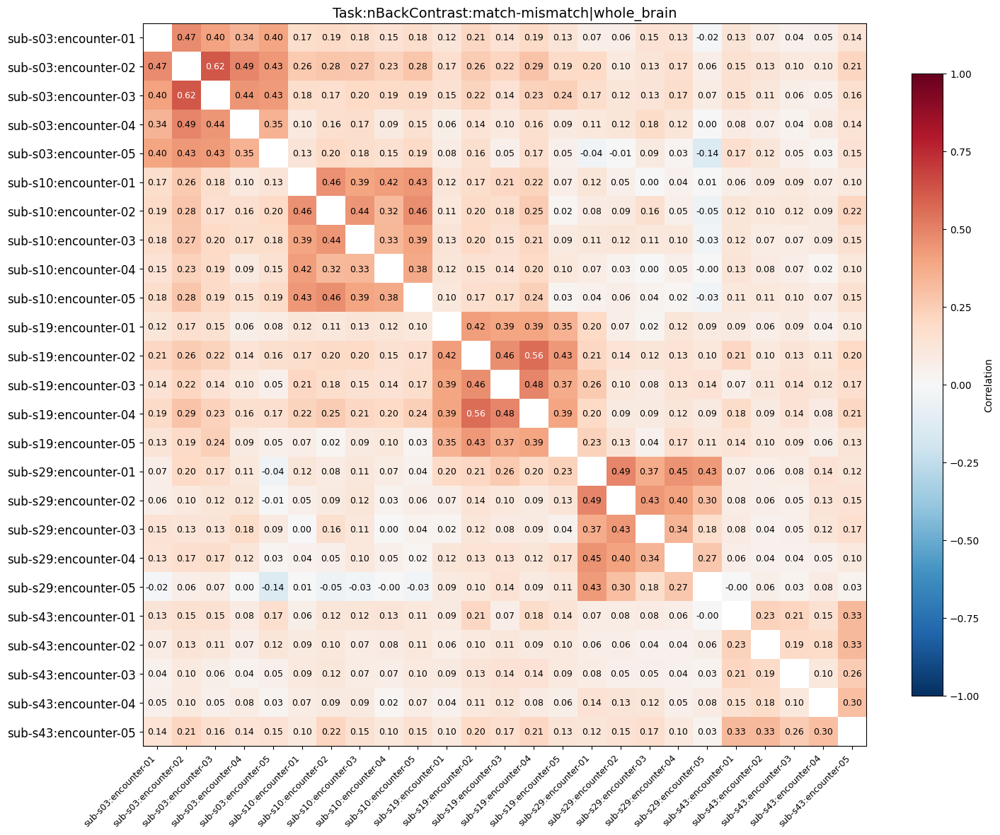

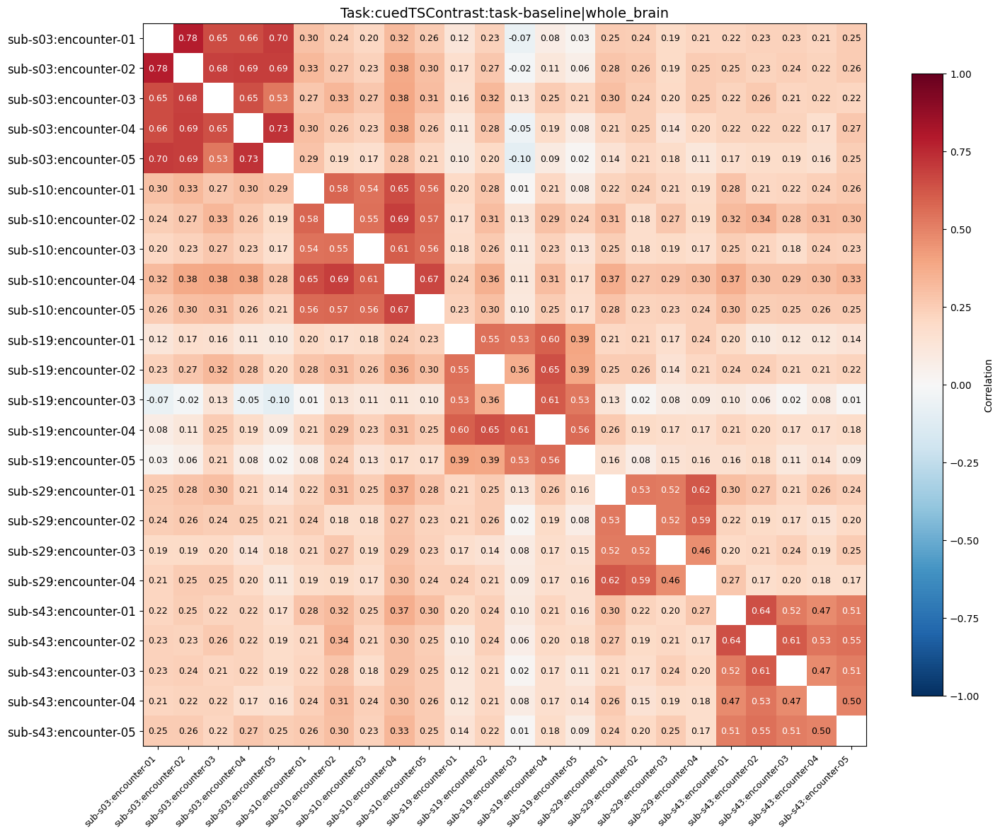

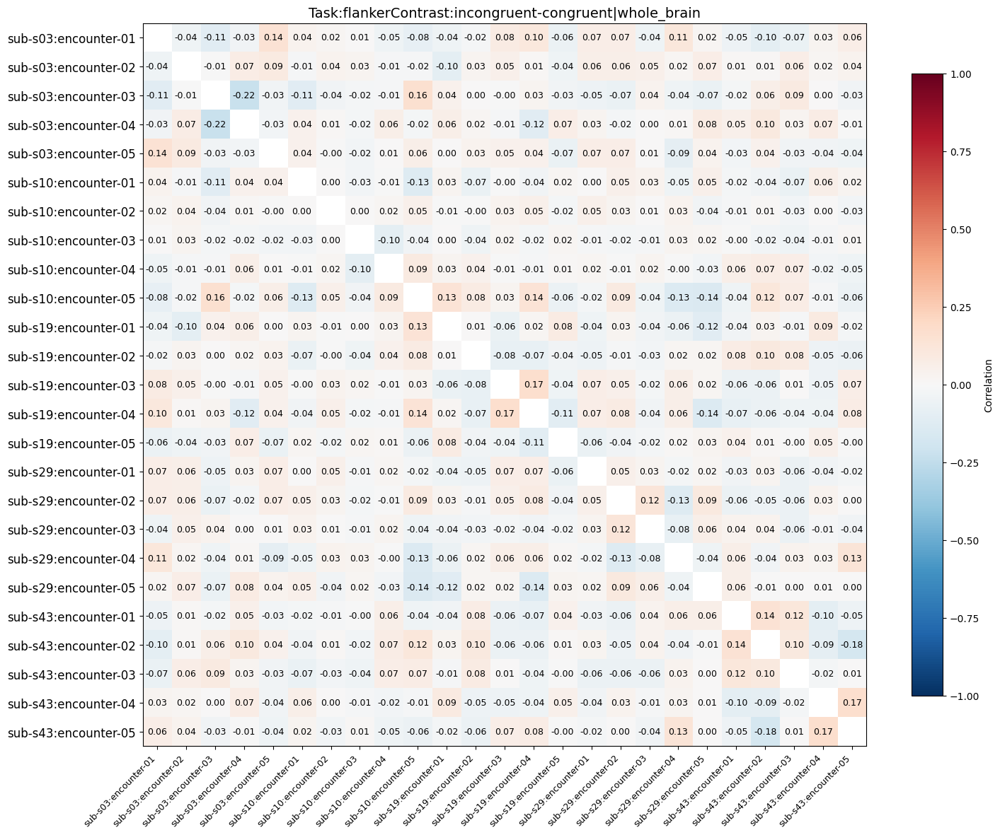

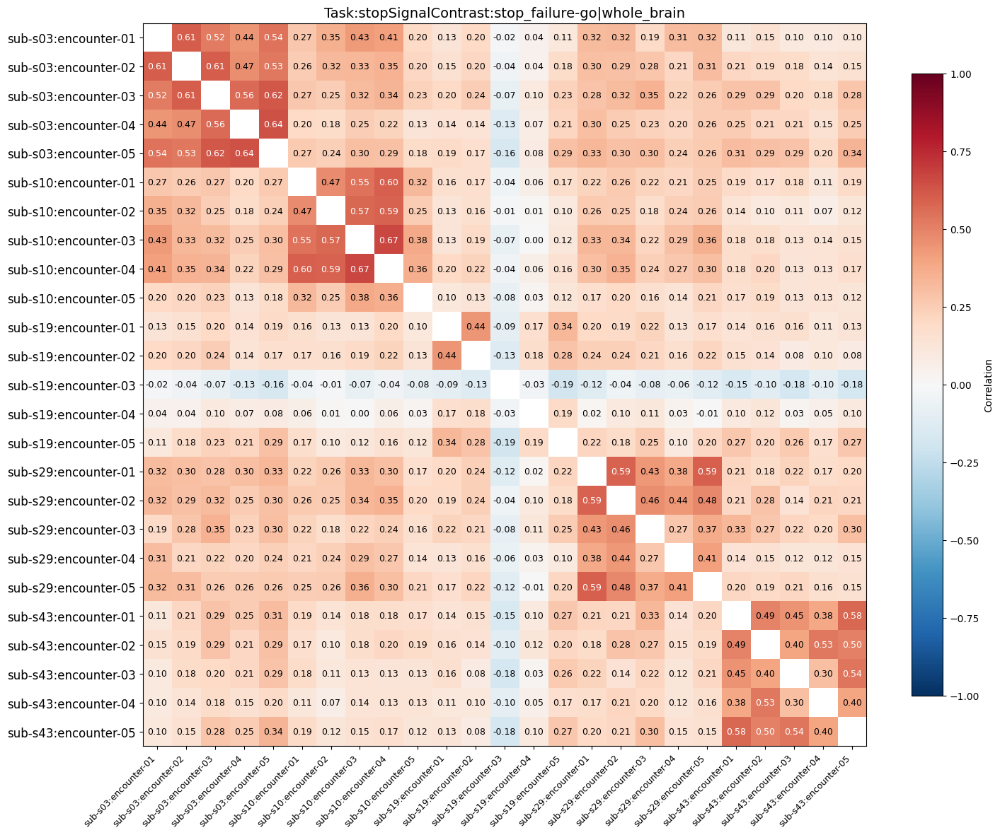

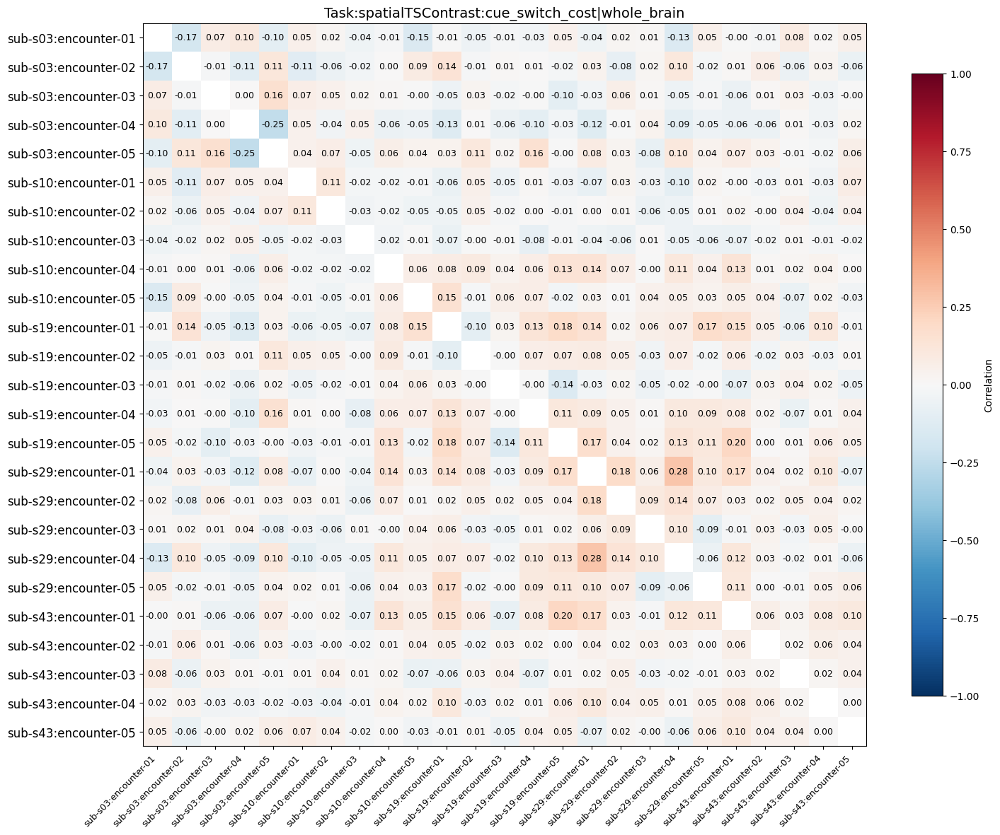

In [85]:
# # here, we can plot the whole brain RSM for all of the task/contrast pairs
# for task in TASKS:
#     for contrast in CONTRASTS[task]:
#         plot_rsm_clean(all_rsms, task, contrast,'whole_brain')

# Instead, we can plot a few of the interesting ones right now:
plot_rsm_clean(all_rsms, "nBack", "match-mismatch",'whole_brain')
plot_rsm_clean(all_rsms, "cuedTS", "task-baseline",'whole_brain')
plot_rsm_clean(all_rsms, "flanker", "incongruent-congruent",'whole_brain')
plot_rsm_clean(all_rsms, "stopSignal", "stop_failure-go",'whole_brain')
plot_rsm_clean(all_rsms, "spatialTS", "cue_switch_cost",'whole_brain')

Looking at these RSMs for the whole brain, it is clear that while some task/contrast combinations have visibly high within-subject correlations across encounters (i.e cuedTS task-baseline), there are others where that is not visibly the case (spatialTS cue_switch_cost). To better understand this, we should quantify the within-subject vs between-subject means.

### Examining the numerical relationships shown in these RSMs

First, we will look the within subject mean correlations compared to between subject mean correlations for each task/contrast combination. This will begin to answer question **1) Are subjects more correlated with themselves than with other subjects?** How consistent is this pattern across regions, tasks, and contrasts?

In [86]:
def analyze_within_between_general(all_rsms, task, contrast, region, n_encounters=5):
    """
    Analyze within-subject vs between-subject variance in a specific task/contrast/region, where between-subject variance is all maps across all encounters.
    
    Parameters:
        all_rsms: RSM data
        task: task name
        contrast: contrast name
        region: brain region (e.g., '1_Visual' or 'whole_brain')
        n_encounters: number of encounters per subject; default=5
    """
    # get specific RSM
    try:
        rsm_matrix = all_rsms[task][contrast][region]['rsm']
        descriptors = all_rsms[task][contrast][region]['descriptors']
        full_title = all_rsms[task][contrast][region]["full_title"]
    except KeyError:
        print(f"Could not find {task}/{contrast}/{region}")
        return None

    # label the data with which subj each map belongs to
    subject_map_indices = {}  # subject_id -> [map indices]
    
    for i, desc in enumerate(descriptors):
        # format: descriptor_name = f"{subject}:encounter-0{encounter + 1}"
        subject_id = desc.split(':')[0]
        
        if subject_id not in subject_map_indices:
            subject_map_indices[subject_id] = []
        subject_map_indices[subject_id].append(i)

    # make sure there are the same number of subjects found for everything
    subjects = list(subject_map_indices.keys())
    n_subjects = len(subjects)
    if (n_subjects < len(SUBJECTS)):
        print(f"{task}|{contrast} is missing subjects")

    # get labeled within and between corr values
    upper_tri = np.triu_indices_from(rsm_matrix, k=1)
    all_correlations = rsm_matrix[upper_tri]
    
    within_subject_corrs = []
    between_subject_corrs = []
    
    for idx, (row, col) in enumerate(zip(upper_tri[0], upper_tri[1])):
        # Find which subjects these two maps belong to
        subj_for_map_row = None
        subj_for_map_col = None
        
        for subject_id, map_indices in subject_map_indices.items():
            if row in map_indices:
                subj_for_map_row = subject_id
            if col in map_indices:
                subj_for_map_col = subject_id
        
        # get the corr
        correlation_value = all_correlations[idx]

        # put the corr into assigned group
        if subj_for_map_row == subj_for_map_col:
            # Same subject
            within_subject_corrs.append(correlation_value)
        else:
            # Different subjects
            between_subject_corrs.append(correlation_value)
            
    # get the means and variances of the two groups
    within_mean = np.mean(within_subject_corrs)
    between_mean = np.mean(between_subject_corrs)
    within_var = np.var(within_subject_corrs)
    between_var = np.var(between_subject_corrs)
    
    # ttest (not sure if necessary because so little data)
    t_stat, p_value = stats.ttest_ind(within_subject_corrs, between_subject_corrs)
    
    results = {
        'within_subject_correlations': within_subject_corrs,
        'between_subject_correlations': between_subject_corrs,
        'within_mean': within_mean,
        'between_mean': between_mean,
        'within_var': within_var,
        'between_var': between_var,
        't_statistic': t_stat,
        'p_value': p_value,
        'full_title': full_title
    }
    
    return results

In [87]:
def plot_RSM_variance_comparison(within_corrs, between_corrs, full_title, p_val = None):
    """
    Plot to visualize within vs between subject correlations

    Parameters:
        within_corrs: list of within correlation values
        between_corrs: list of within correlation values
        full_title: title of figure
        p_val: pre-calculated p value
    """
    
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    
    # Histogram
    ax1 = axes[0]
    ax1.hist(within_corrs, alpha=0.7, label=f'Within-subject (n={len(within_corrs)})', 
             bins=30, color='blue', density=True)
    ax1.hist(between_corrs, alpha=0.7, label=f'Between-subject (n={len(between_corrs)})', 
             bins=30, color='red', density=True)
    within_mean = np.mean(within_corrs)
    between_mean = np.mean(between_corrs)
    ax1.axvline(within_mean, color='darkblue', linestyle='--', linewidth=2, 
            label=f'Within mean: {within_mean:.3f}')
    ax1.axvline(between_mean, color='darkred', linestyle='--', linewidth=2, 
            label=f'Between mean: {between_mean:.3f}')
    ax1.set_xlabel('Correlation Value')
    ax1.set_ylabel('Density')
    ax1.set_title('Distribution of Correlations')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Box plot
    ax2 = axes[1]
    box_data = [within_corrs, between_corrs]
    box_plot = ax2.boxplot(box_data, tick_labels=['Within-Subject', 'Between-Subject'], 
                          patch_artist=True)
    box_plot['boxes'][0].set_facecolor('blue')
    box_plot['boxes'][1].set_facecolor('red')
    ax2.set_ylabel('Correlation Value')
    ax2.set_title('Within vs Between Subject Correlations')
    ax2.grid(True, alpha=0.3)

    fig.suptitle(full_title, fontsize=14)
    plt.tight_layout()
    plt.show()

    if p_val is None:
        t_stat, p_val = stats.ttest_ind(within_corrs, between_corrs)
        
    print(f"p = {p_val:.2e}")


Lets plot one as an example before calculating all of them:

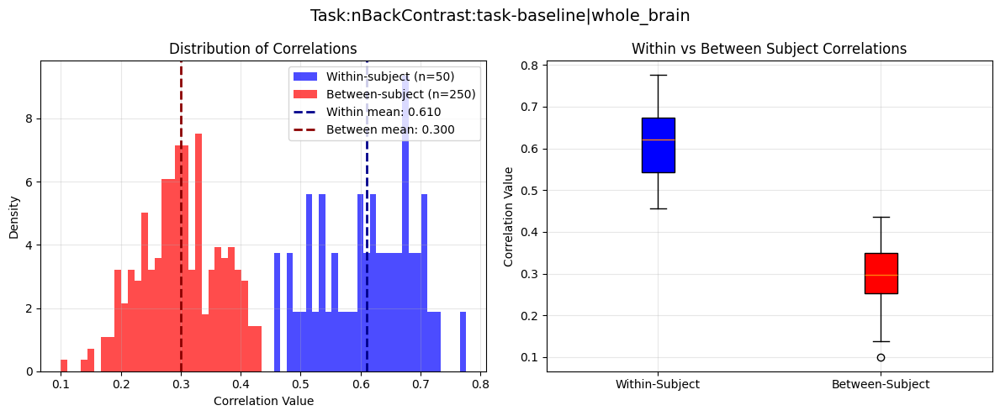

p = 4.93e-89


In [88]:
res = analyze_within_between_general(all_rsms, "nBack", "task-baseline", "whole_brain")
within_corrs = res['within_subject_correlations']
between_corrs = res['between_subject_correlations']
full_title = res['full_title']
plot_RSM_variance_comparison(within_corrs, between_corrs, full_title, p_val = res['p_value'])

Here, we see that the within subject correlations for task-baseline in whole brain nBack are significantly higher than between-subject. This is good to see as a sanity check, because it suggests that our data at least shows consistency between subjects (otherwise we would have had to worry that there may be too much noise).

Now, we can calculate this and plot this for all of the tasks/contrasts in each of the 7 regions + whole brain to achieve the same sanity check.

Now, we can calculate this and plot this for each region, by including all of the tasks/contrasts pairs.

In [89]:
REGIONS = ["whole_brain", "1_Visual", "2_Somatomotor", "3_Dorsal Attention", "4_Ventral Attention", "5_Limbic",
              "6_Frontoparietal Control", "7_Default Mode"]
corrs_total_dict = {}
within_corrs_combined = {}
between_corrs_combined = {}

# for later analysis
means = {} # keeps track of the within and between means for all contrasts of a task

for region in REGIONS:
    within_corrs_combined[region] = []
    between_corrs_combined[region] = []
    means[region] = {}
    
    for task in TASKS:
        corrs_total_dict[task]={}
        means[region][task] = {"contrast_name":[],"within_mean":[], "between_mean":[], "within_var":[], "between_var":[]}
    
        for contrast in CONTRASTS[task]:
            corrs_total_dict[task][contrast]={}
            corrs_total_dict[task][contrast][region]={}
            means[region][task]["contrast_name"].append(contrast)

            # save all of the task/contrast/region results
            corrs_total_dict[task][contrast][region] = analyze_within_between_general(all_rsms, task, contrast, region)

            # add the within and between corrs to the running lists
            within_corrs_combined[region].extend(corrs_total_dict[task][contrast][region]["within_subject_correlations"])
            between_corrs_combined[region].extend(corrs_total_dict[task][contrast][region]["between_subject_correlations"])

            # add to the means dict
            means[region][task]["within_mean"].append(corrs_total_dict[task][contrast][region]["within_mean"])
            means[region][task]["between_mean"].append(corrs_total_dict[task][contrast][region]["between_mean"])
            means[region][task]["within_var"].append(corrs_total_dict[task][contrast][region]["within_var"])
            means[region][task]["between_var"].append(corrs_total_dict[task][contrast][region]["between_var"])

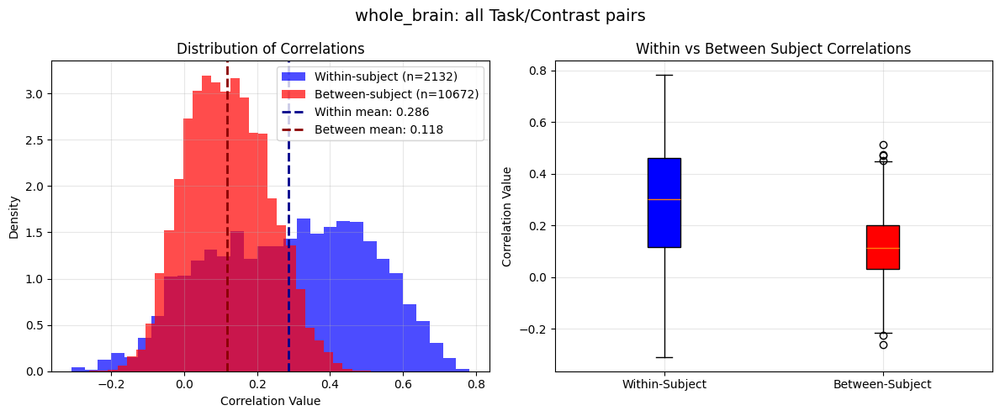

p = 0.00e+00


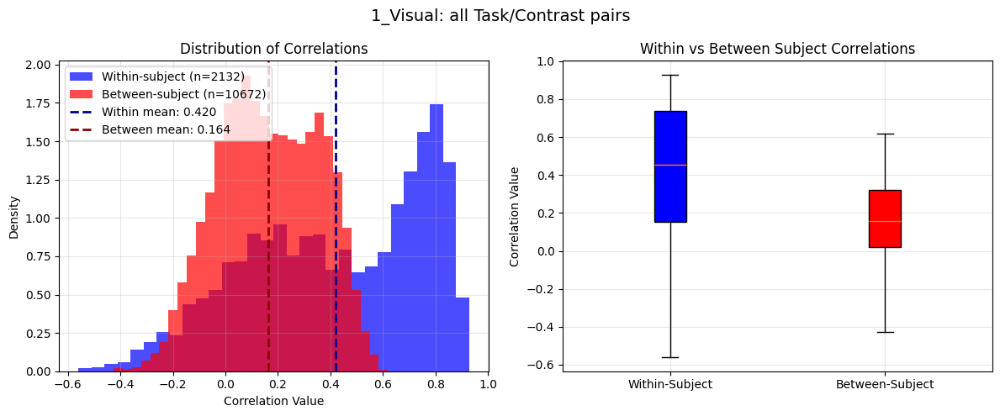

p = 0.00e+00


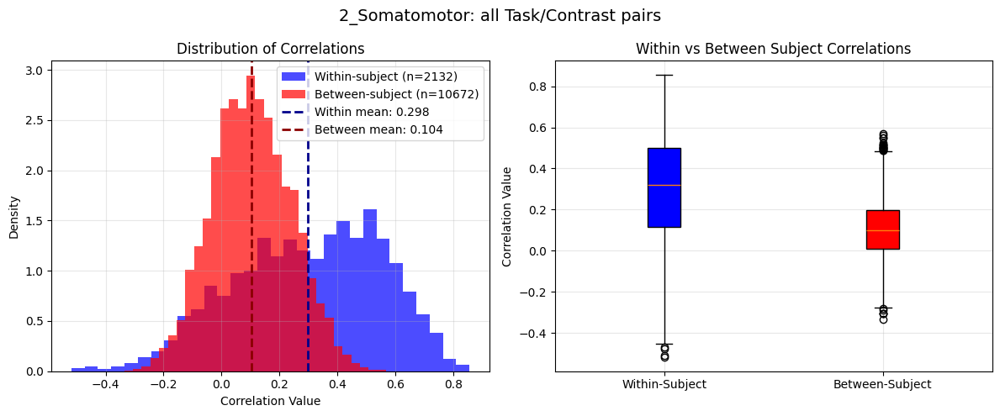

p = 0.00e+00


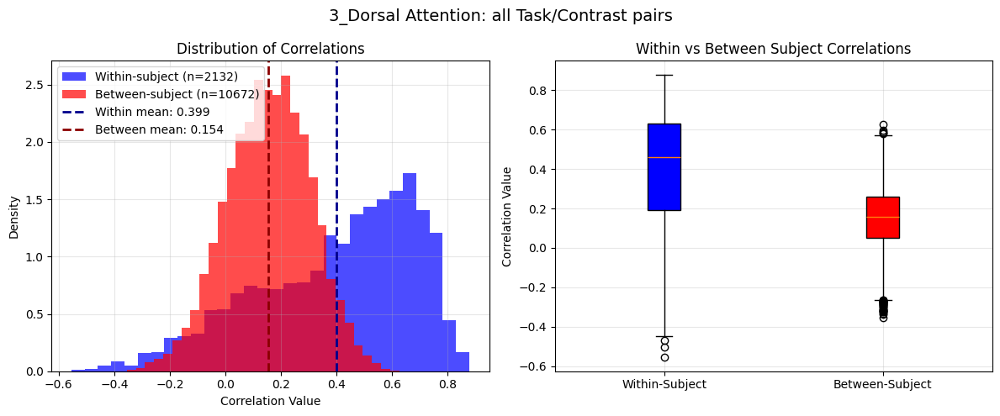

p = 0.00e+00


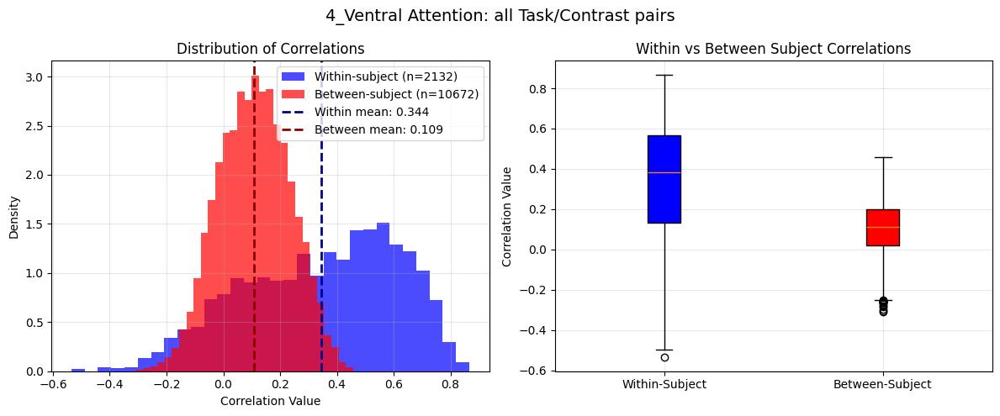

p = 0.00e+00


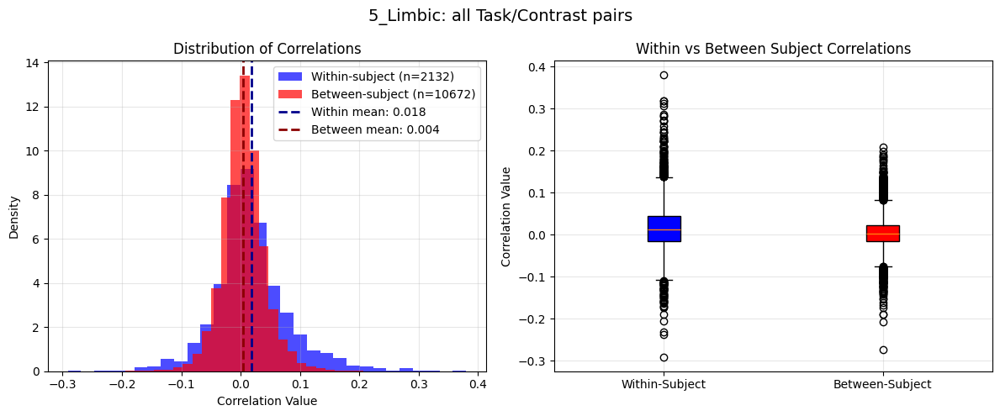

p = 4.53e-43


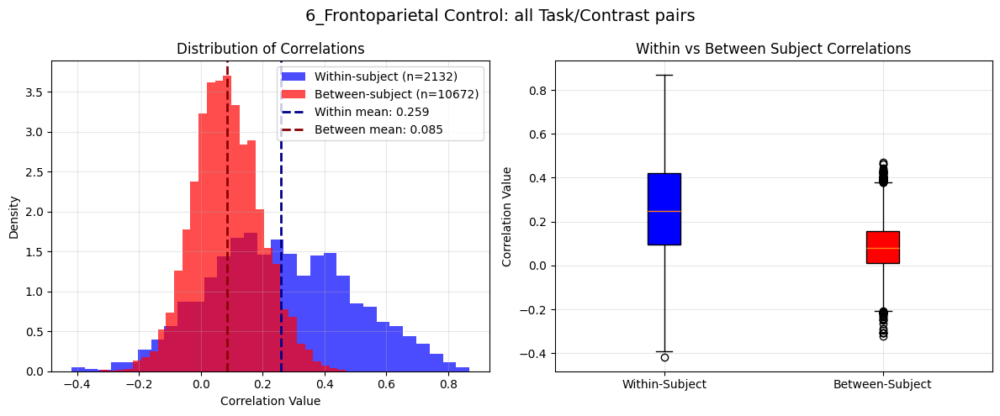

p = 0.00e+00


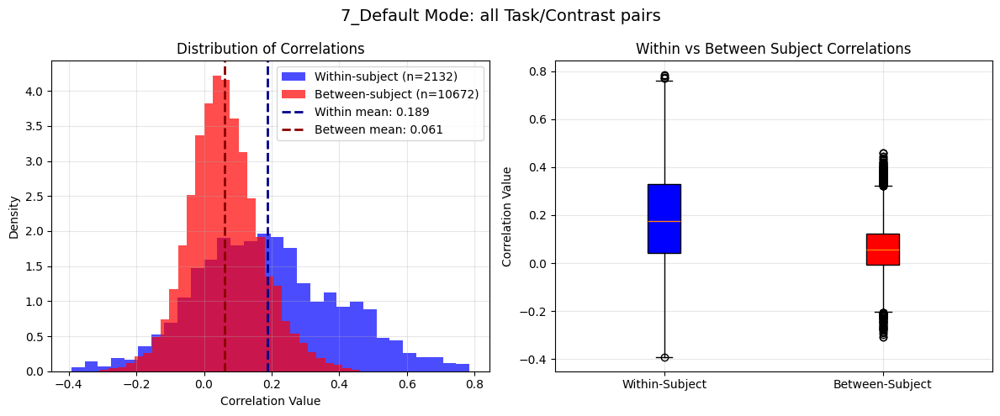

p = 0.00e+00


In [90]:
# plot the overall within vs between subject correlations for each region
for region in REGIONS:
    full_title = f"{region}: all Task/Contrast pairs" 
    
    plot_RSM_variance_comparison(within_corrs_combined[region], between_corrs_combined[region], full_title)


# save this to another variable so it does not get overwritten later
within_between_general_corrs = {"within": within_corrs_combined, "between": between_corrs_combined}
within_between_general_means = means

Looking at this, we get a picture of the overall within-subject vs between-subject correlation values. We can see that across the regions, including the whole brain, **mean within subject correlations are higher than mean between subject correlations.** Interestingly, there seems to be a difference on how large this difference is depending on the network (i.e. in the Limbic Yeo network the difference between distributions seems smaller than in the rest). 

To answer the second part of our first question (**How consistent is this pattern across regions, tasks, and contrasts?**) we should plot the corresponding within and between means for every task/contrast pair, masked by region. 

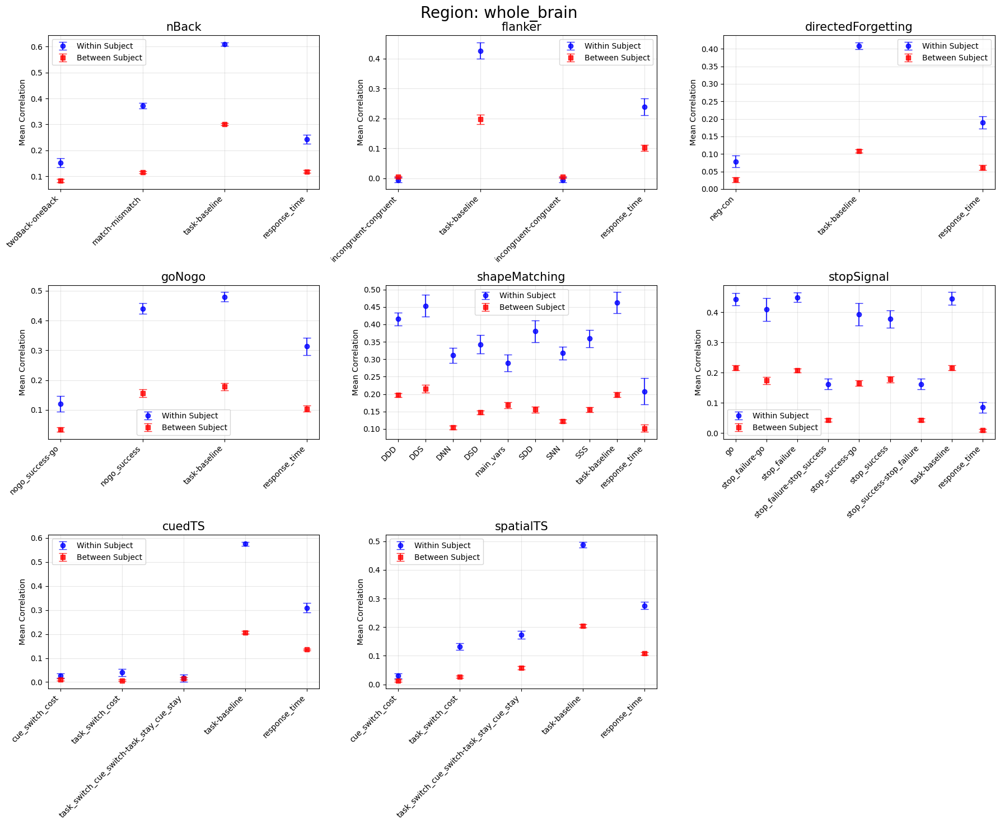

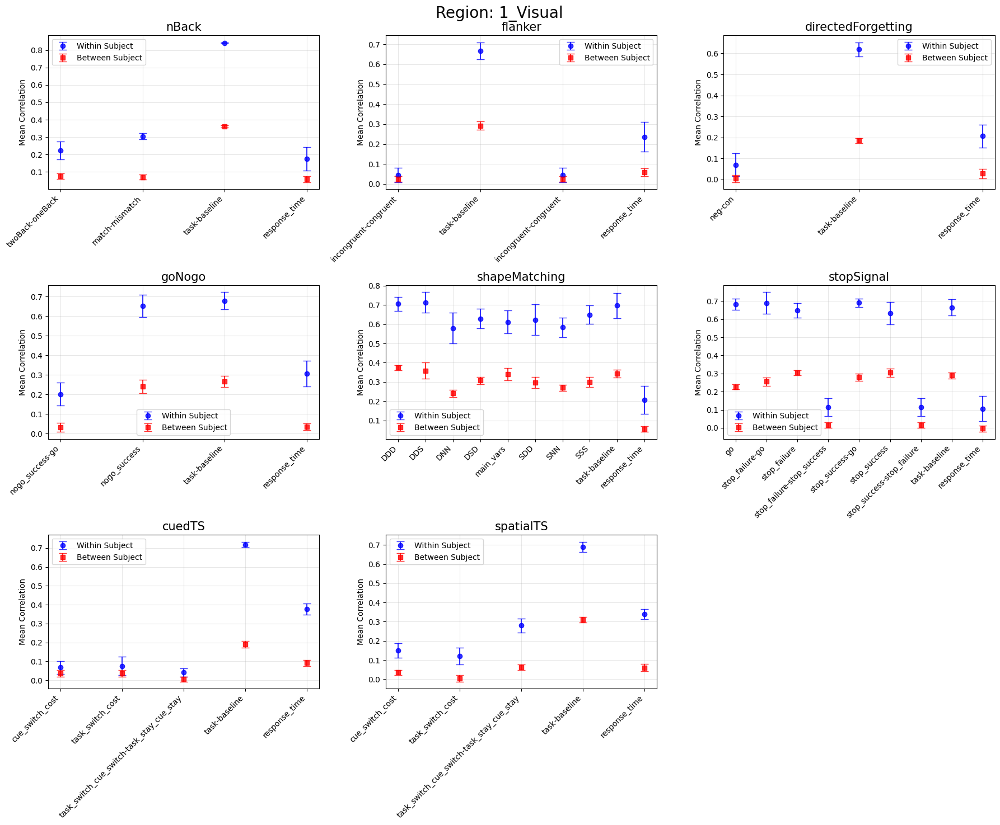

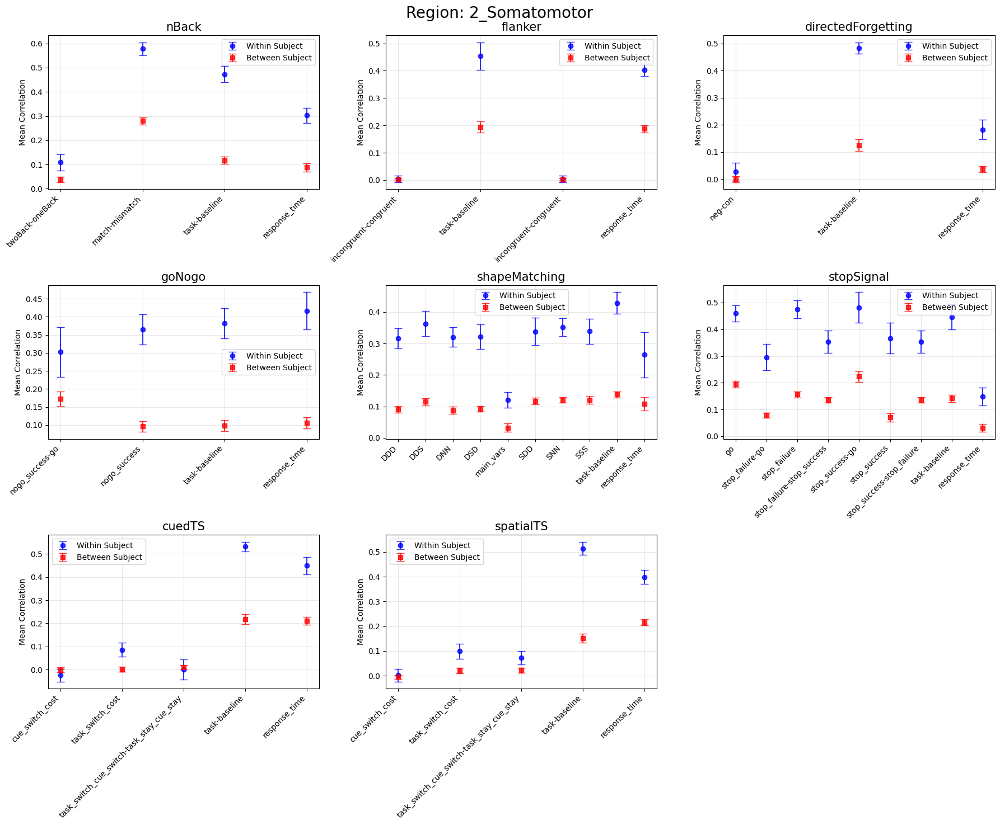

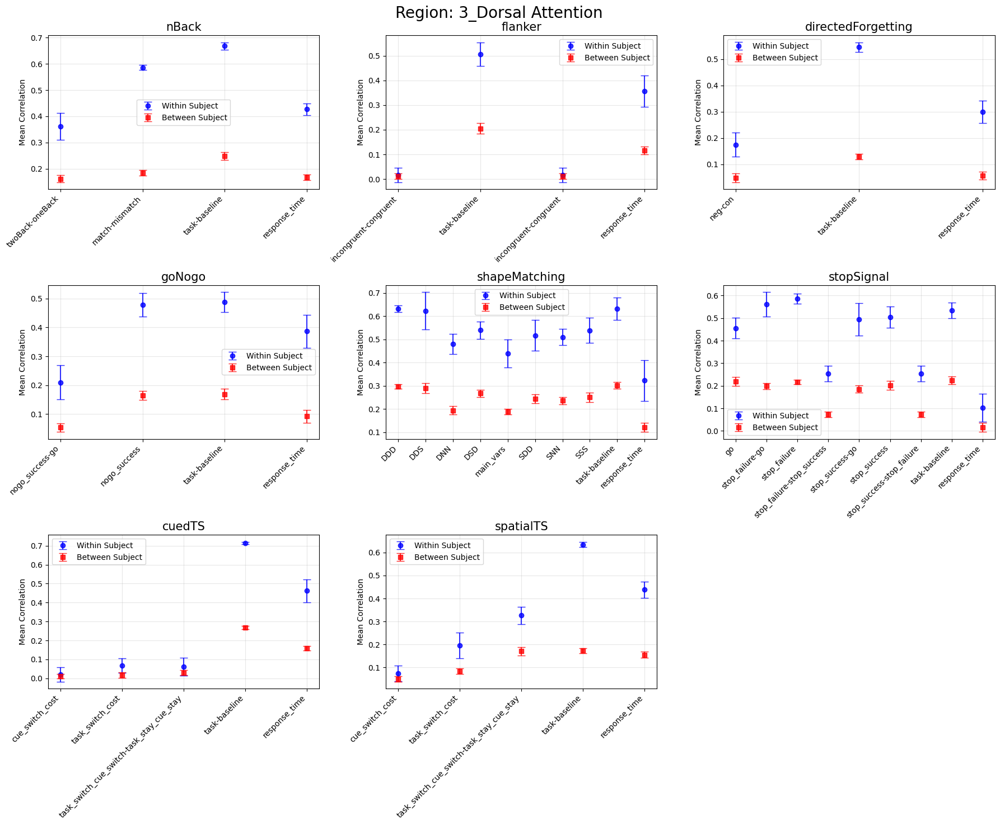

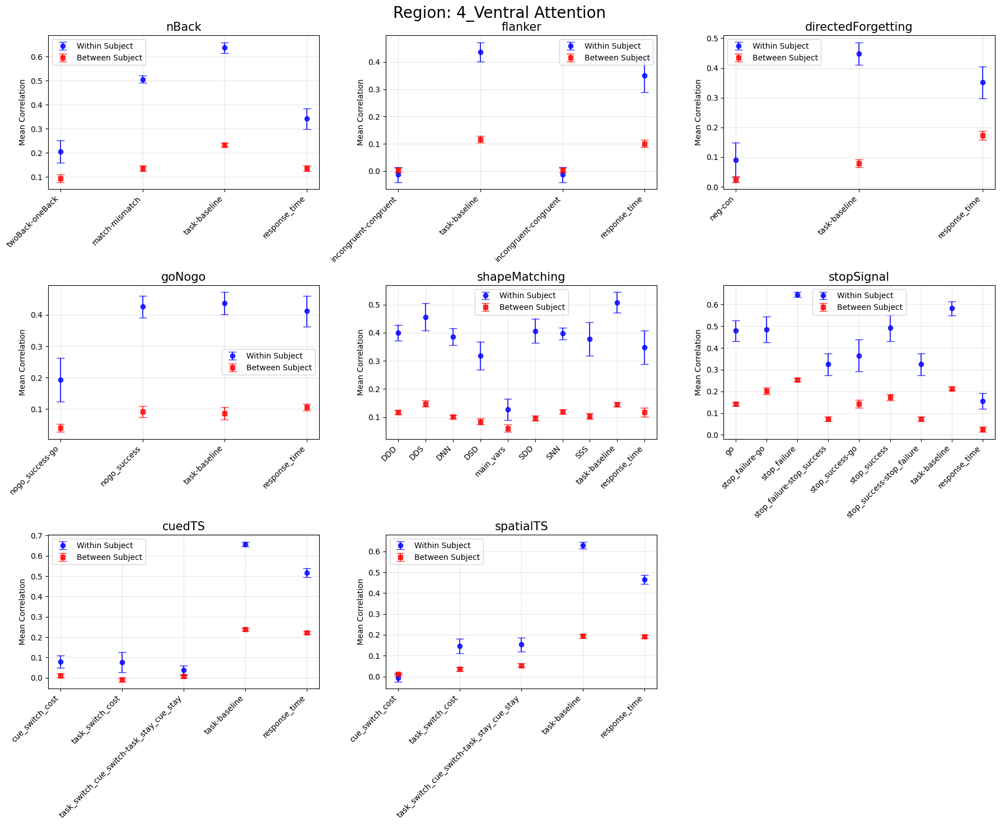

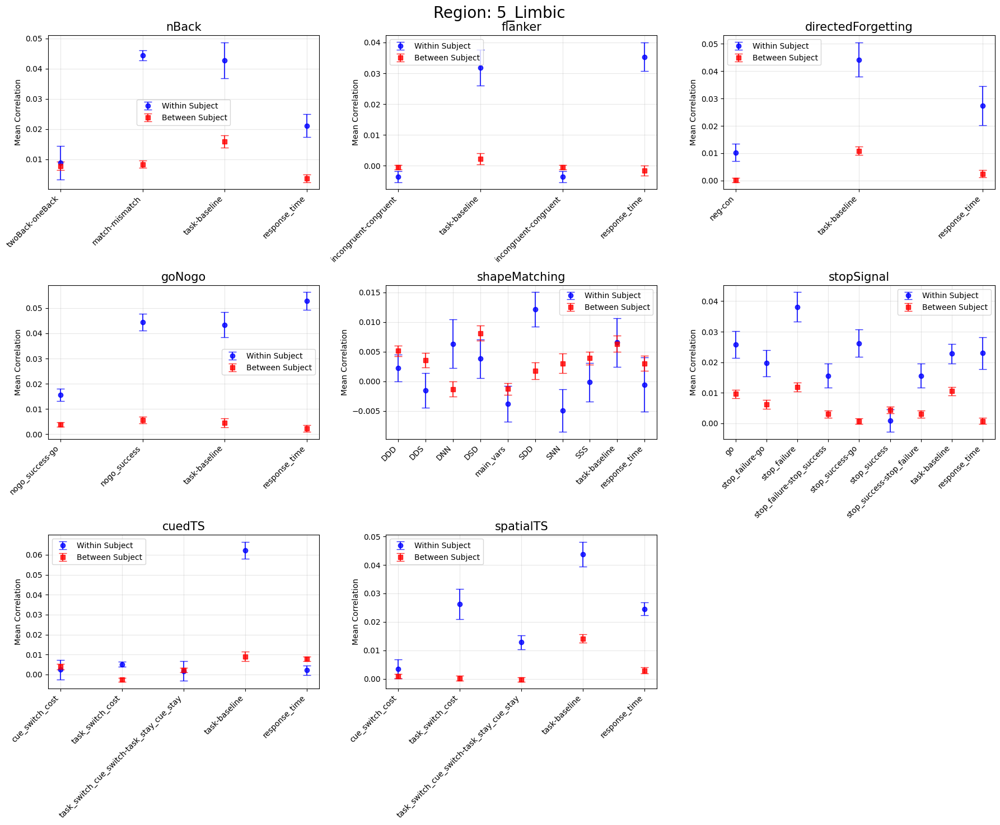

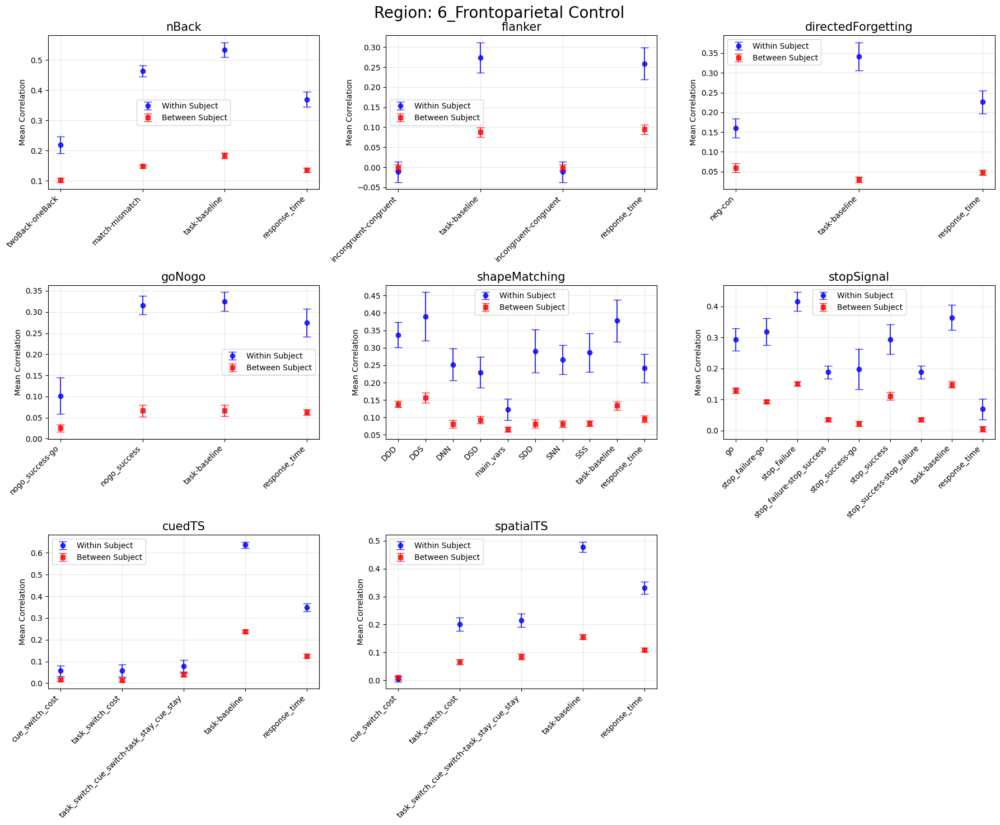

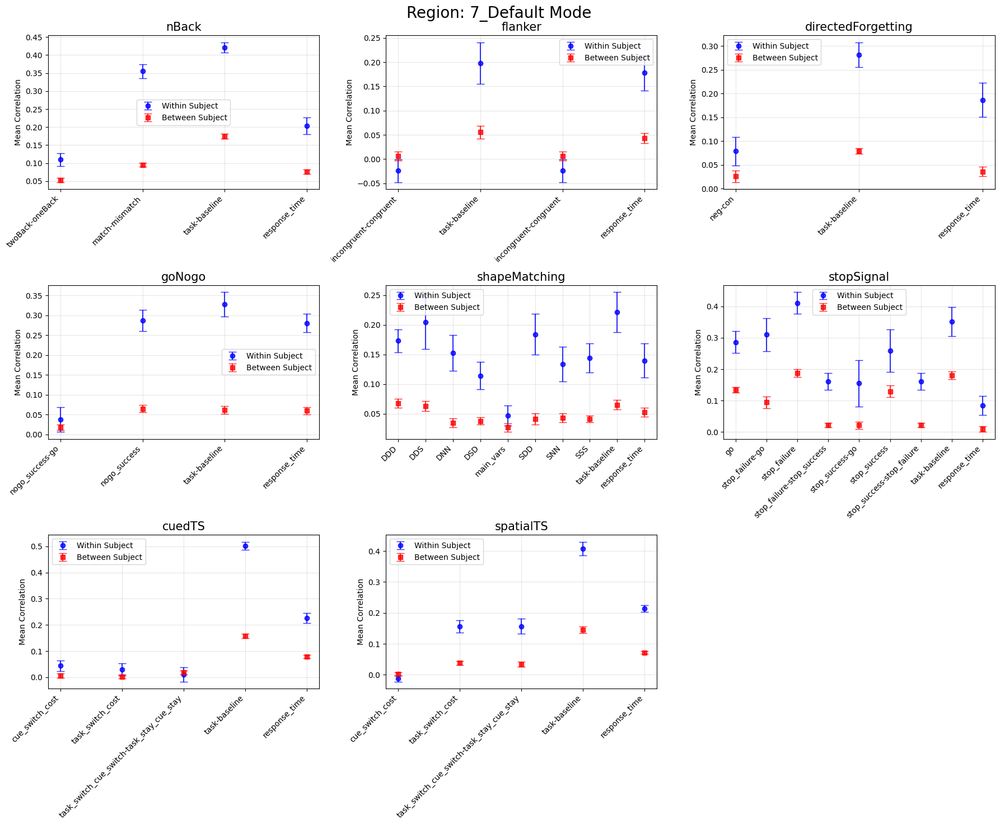

In [91]:
# make a plot where, per region/task, we can see the mean within and the mean between for each contrast 
for region in REGIONS:
    # Calc grid dimensions
    n_tasks = len(TASKS)
    n_cols = min(3, n_tasks)
    n_rows = math.ceil(n_tasks / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
    
    fig.suptitle(f'Region: {region}', fontsize=20)
    
    for i, task in enumerate(TASKS):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row, col] if n_rows > 1 else axes[col]
        
        contrasts = means[region][task]["contrast_name"]
        within_means = means[region][task]["within_mean"]
        between_means = means[region][task]["between_mean"]
        within_vars = means[region][task]["within_var"]
        between_vars = means[region][task]["between_var"]
        
        x_pos = np.arange(len(contrasts))

        ax.errorbar(x_pos, within_means, yerr=within_vars, fmt='o', 
           color='blue', capsize=5, alpha=0.8, label='Within Subject')
        ax.errorbar(x_pos, between_means, yerr=between_vars, fmt='s', 
           color='red', capsize=5, alpha=0.8, label='Between Subject')
        
        ax.set_ylabel('Mean Correlation')
        ax.set_title(f'{task}', fontsize=15)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(contrasts, rotation=45, ha='right', fontsize=10)
        ax.legend()
        ax.grid(True, alpha=0.3)

        # Hide unused subplots
        for i in range(len(TASKS), n_rows * n_cols):
            row = i // n_cols
            col = i % n_cols
            axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

Again, we see that: in most region/task/contrast groups **the within subject mean correlation is greater than between subjects**. This is another clear sanity check; however, there are some clear exceptions to this that are worth exploring (particularly in the Limbic network but also in the FrontoParietal control network (and occasionally in some other regions)). The fact that this is network specific and not whole brain (where every task/contrast pair has a within subject mean greater than a between subject mean), may suggest many things. One such thing is that participants have different strategies/activations in certain networks across different times--thereby decreasing their internal consistency.

To reflect back to the question we were asking, we have now answered question 1: Are subjects more correlated with themselves than with other subjects? How consistent is this pattern across regions, tasks, and contrasts?
- Subjects are more correlated with themselves than with other subjects overall, and in the whole-brain this is consistent across all tasks/contrasts (at varying differences). This is a good sanity check, and suggests we are getting some signal. Interestingly, it seems that in certain Yeo networks (i.e. the Limbic and Frontoparietal control networks) this is not true for every task/contrast. While we cannot over interpret this, it does suggest that there might be something interesting happening in these networks, and that there might be activation changes occuring over time.

This is good motivation to go on to question 2) **In each of the Yeo networks and the whole brain, are subjects more correlated with themselves during other encounters of a given task/contrast, or with other subjects in the same encounter?** This will be a stricter test of within-subject correlations, as it will compare a subject with themselves across time in the same task/contrast vs with another subject in the same task/contrast/encounter. 

In [92]:
# calculate within-subject correlations as before, but only count as a between-subj correlation if in the same encounter number
def analyze_within_between_encounters(all_rsms, task, contrast, region, n_encounters=5):
    """
    Analyze within-subject vs same encounter between-subject variance in a specific task/contrast/region.
    
    Parameters:
        all_rsms: RSM data
        task: task name
        contrast: contrast name
        region: brain region (e.g., '1_Visual' or 'whole_brain')
        n_encounters: number of encounters per subject; default=5
    """
    # get specific RSM
    try:
        rsm_matrix = all_rsms[task][contrast][region]['rsm']
        descriptors = all_rsms[task][contrast][region]['descriptors']
        full_title = all_rsms[task][contrast][region]["full_title"]
    except KeyError:
        print(f"Could not find {task}/{contrast}/{region}")
        return None

    # label the data with which subj and encounter each map belongs to
    subject_map_indices = {}  # subject_id -> [map indices]
    encounter_map_indices = {}  # encounter_id -> [map indices]
    
    for i, desc in enumerate(descriptors):
        # format: descriptor_name = f"{subject}:encounter-0{encounter + 1}"
        subject_id = desc.split(':')[0]
        encounter_id = desc.split('encounter-0')[1]
        
        if subject_id not in subject_map_indices:
            subject_map_indices[subject_id] = []
        if encounter_id not in encounter_map_indices:
            encounter_map_indices[encounter_id] = []
        subject_map_indices[subject_id].append(i)
        encounter_map_indices[encounter_id].append(i)

    # make sure there are the same number of subjects found for everything
    subjects = list(subject_map_indices.keys())
    n_subjects = len(subjects)
    if (n_subjects < len(SUBJECTS)):
        print(f"{task}|{contrast} is missing subjects")

    # get labeled within and between corr values
    upper_tri = np.triu_indices_from(rsm_matrix, k=1)
    all_correlations = rsm_matrix[upper_tri]
    
    within_subject_corrs = []
    between_subject_same_enc_corrs = []
    
    for idx, (row, col) in enumerate(zip(upper_tri[0], upper_tri[1])):
        # Find which subjects and encounters these two maps belong to
        subj_for_map_row = None
        subj_for_map_col = None
        enc_for_map_row = None
        enc_for_map_col = None
        
        for subject_id, map_indices in subject_map_indices.items():
            if row in map_indices:
                subj_for_map_row = subject_id
            if col in map_indices:
                subj_for_map_col = subject_id
                
        for encounter_id, map_indices in encounter_map_indices.items():
            if row in map_indices:
                enc_for_map_row = encounter_id
            if col in map_indices:
                enc_for_map_col = encounter_id
        
        
        # get the corr
        correlation_value = all_correlations[idx]

        # put the corr into assigned group
        if subj_for_map_row == subj_for_map_col:
            # Same subject
            within_subject_corrs.append(correlation_value)
        else:
            # Different subjects; only add if they're in the same encounter number
            if enc_for_map_row == enc_for_map_col:
                between_subject_same_enc_corrs.append(correlation_value)
            
    # get the means and variances of the two groups
    within_mean = np.mean(within_subject_corrs)
    between_mean = np.mean(between_subject_same_enc_corrs)
    within_var = np.var(within_subject_corrs)
    between_var = np.var(between_subject_same_enc_corrs)
    
    # ttest (not sure if necessary because so little data)
    t_stat, p_value = stats.ttest_ind(within_subject_corrs, between_subject_same_enc_corrs)

    # edit the title to make it clear that the between is by-encounter
    full_title = f"Within-subj vs same encounter number between-subj corrs: {full_title}"
    
    results = {
        'within_subject_correlations': within_subject_corrs,
        'between_subject_correlations': between_subject_same_enc_corrs,
        'within_mean': within_mean,
        'between_mean': between_mean,
        'within_var': within_var,
        'between_var': between_var,
        't_statistic': t_stat,
        'p_value': p_value,
        'full_title': full_title
    }
    
    return results

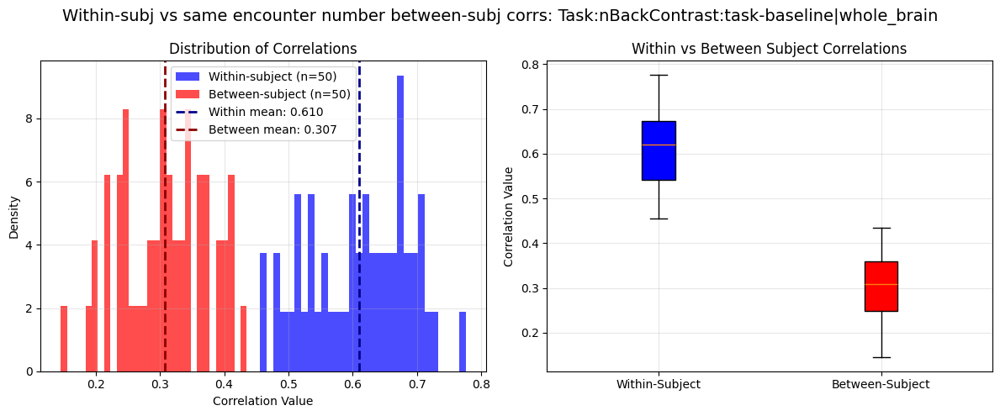

p = 6.59e-37


In [93]:
res = analyze_within_between_encounters(all_rsms, "nBack", "task-baseline", "whole_brain")
within_corrs = res['within_subject_correlations']
between_corrs = res['between_subject_correlations']
full_title = res['full_title']
plot_RSM_variance_comparison(within_corrs, between_corrs, full_title, p_val = res['p_value'])

This is very similar to the result we got when including all between-subj maps (not only of the same encounter number). However, the btween subject mean is now slighly bigger (0.307 instead of 0.300). This is negligible, but it is interesting to see what happens when we do this across networks (the way we did for question 1).

In [94]:
REGIONS = ["whole_brain", "1_Visual", "2_Somatomotor", "3_Dorsal Attention", "4_Ventral Attention", "5_Limbic",
              "6_Frontoparietal Control", "7_Default Mode"]
corrs_total_dict = {}
within_corrs_combined = {}
between_corrs_combined = {}

# for later analysis
means = {} # keeps track of the within and between means for all contrasts of a task

for region in REGIONS:
    within_corrs_combined[region] = []
    between_corrs_combined[region] = []
    means[region] = {}
    
    for task in TASKS:
        corrs_total_dict[task]={}
        means[region][task] = {"contrast_name":[],"within_mean":[], "between_mean":[], "within_var":[], "between_var":[]}
    
        for contrast in CONTRASTS[task]:
            corrs_total_dict[task][contrast]={}
            corrs_total_dict[task][contrast][region]={}
            means[region][task]["contrast_name"].append(contrast)

            # save all of the task/contrast/region results
            corrs_total_dict[task][contrast][region] = analyze_within_between_encounters(all_rsms, task, contrast, region)

            # add the within and between corrs to the running lists
            within_corrs_combined[region].extend(corrs_total_dict[task][contrast][region]["within_subject_correlations"])
            between_corrs_combined[region].extend(corrs_total_dict[task][contrast][region]["between_subject_correlations"])

            # add to the means dict
            means[region][task]["within_mean"].append(corrs_total_dict[task][contrast][region]["within_mean"])
            means[region][task]["between_mean"].append(corrs_total_dict[task][contrast][region]["between_mean"])
            means[region][task]["within_var"].append(corrs_total_dict[task][contrast][region]["within_var"])
            means[region][task]["between_var"].append(corrs_total_dict[task][contrast][region]["between_var"])

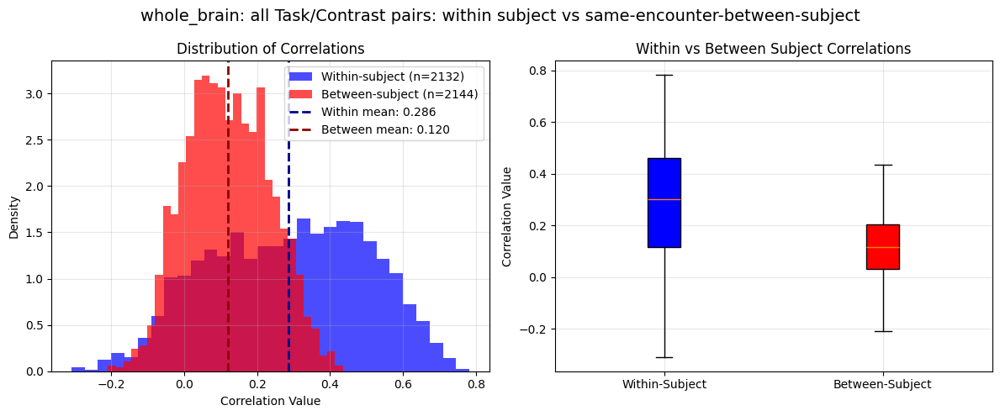

p = 1.31e-196


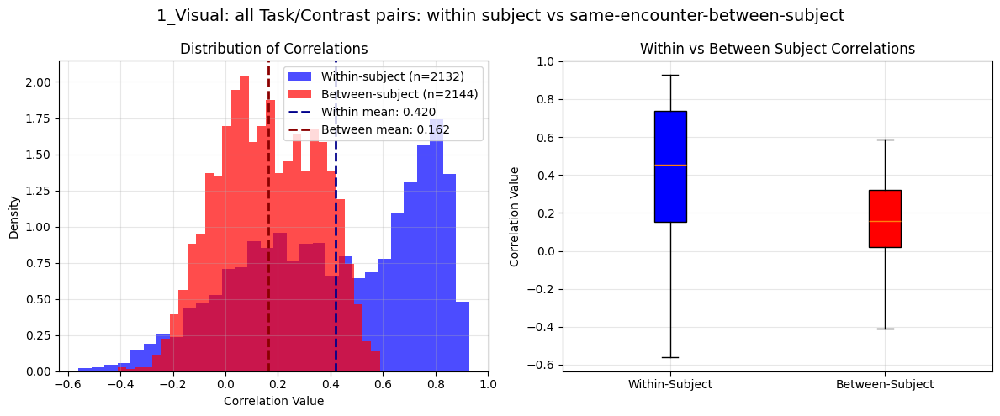

p = 1.01e-189


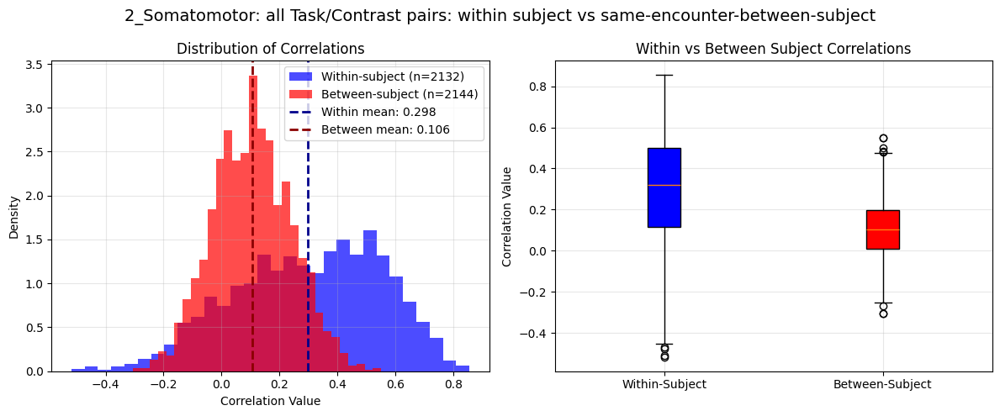

p = 4.23e-190


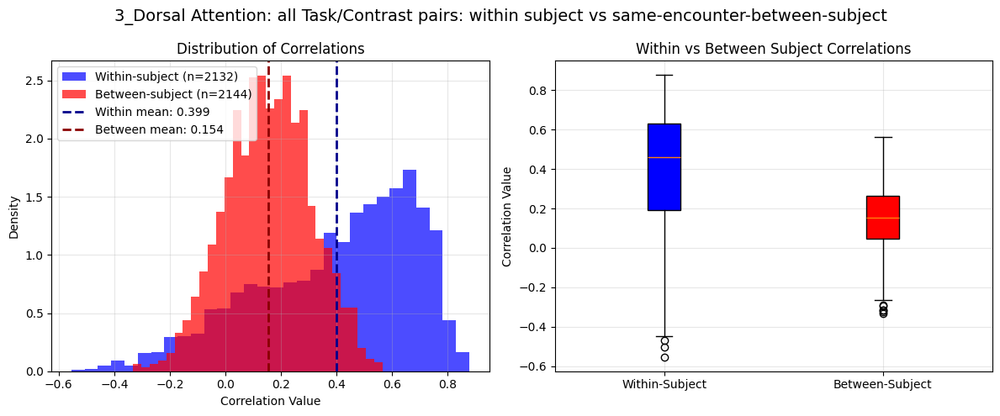

p = 9.52e-237


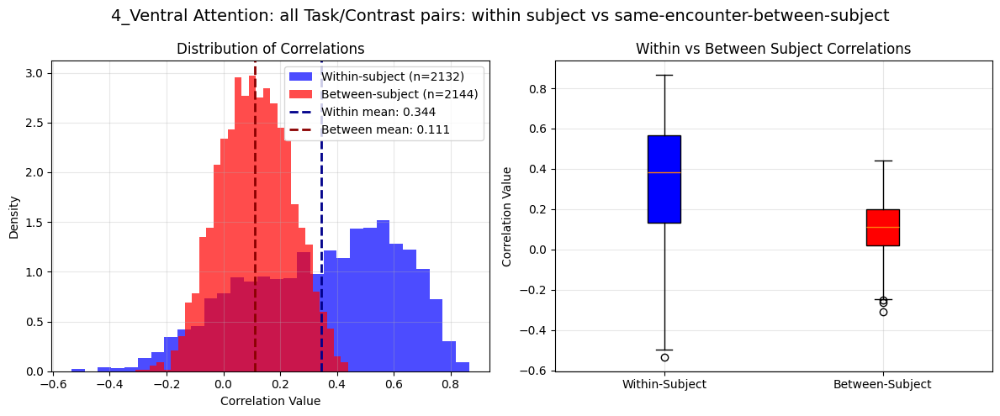

p = 1.06e-249


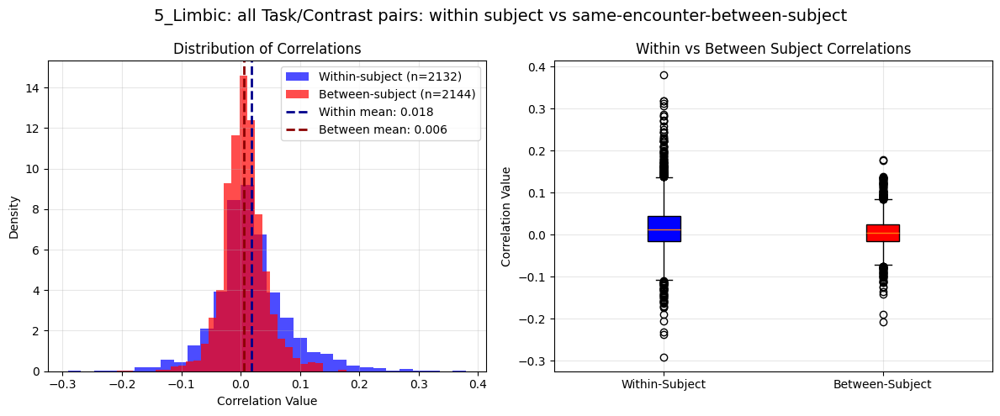

p = 1.69e-13


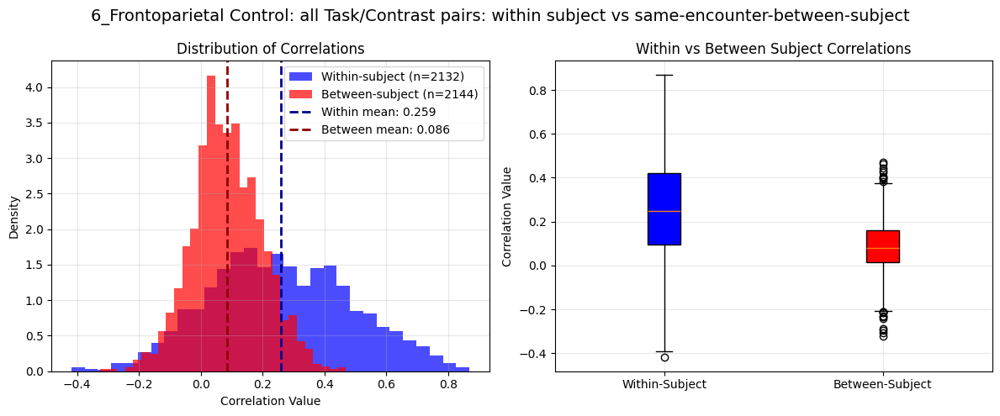

p = 6.29e-193


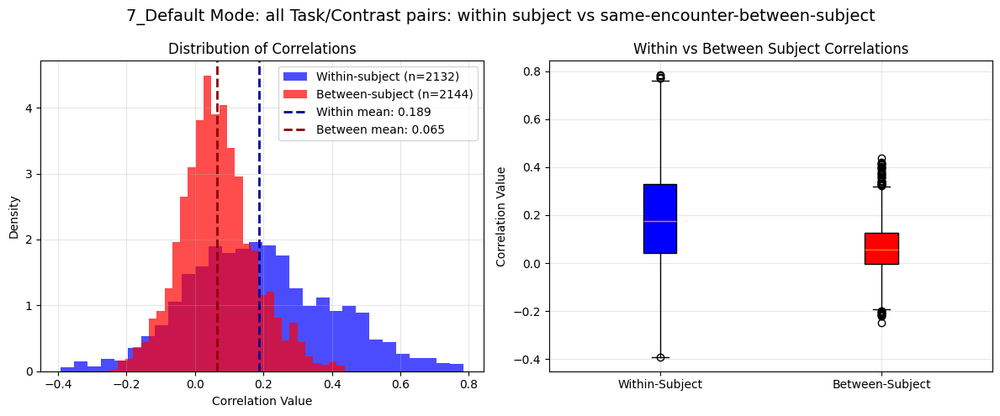

p = 2.81e-121


In [95]:
# plot the overall within vs between subject correlations for each region
for region in REGIONS:
    full_title = f"{region}: all Task/Contrast pairs: within subject vs same-encounter-between-subject" 
    
    plot_RSM_variance_comparison(within_corrs_combined[region], between_corrs_combined[region], full_title)


# save this to another variable so it does not get overwritten later
within_between_encounters_corrs = {"within": within_corrs_combined, "between": between_corrs_combined}
within_between_encounters_means = means

Looking at this, again the difference seems to be consistent, however it seems as if the between-subject means have increased slightly now that we are only including same encounters. We can check if that is the case:

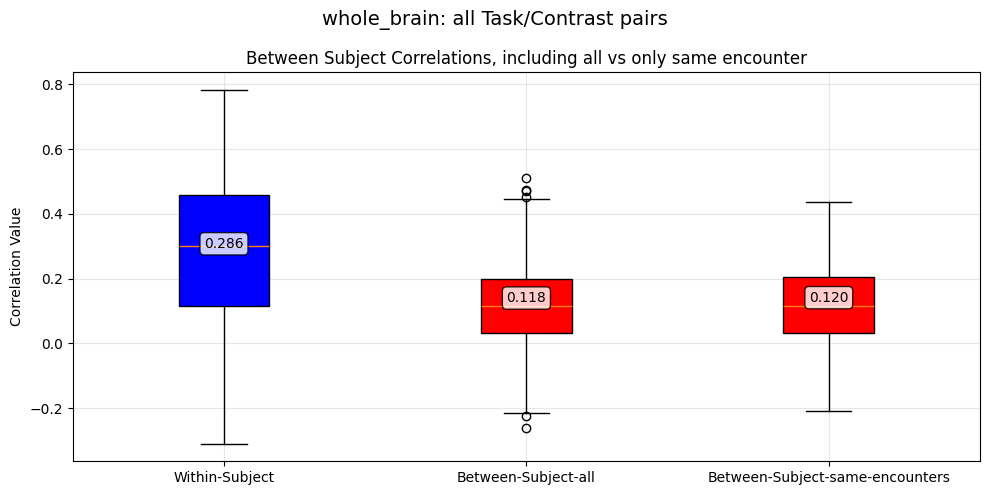

p = 6.45e-01


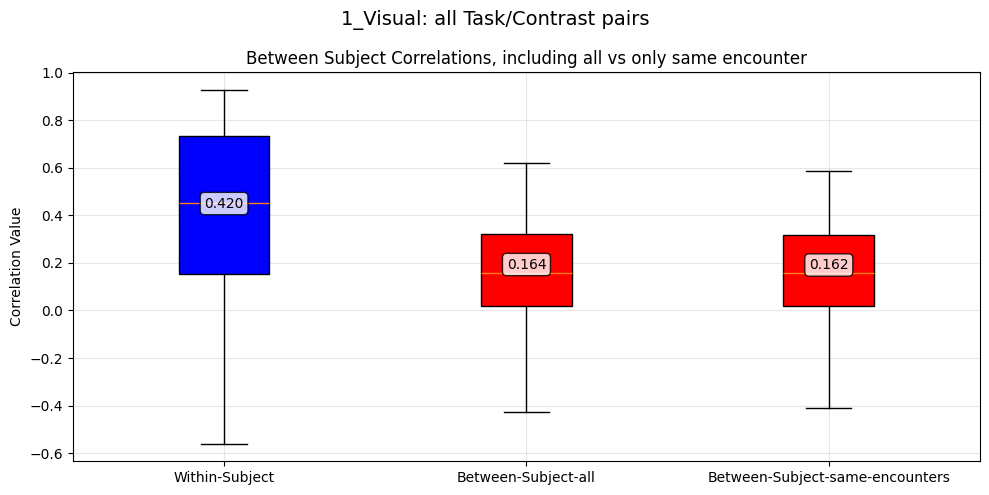

p = 6.26e-01


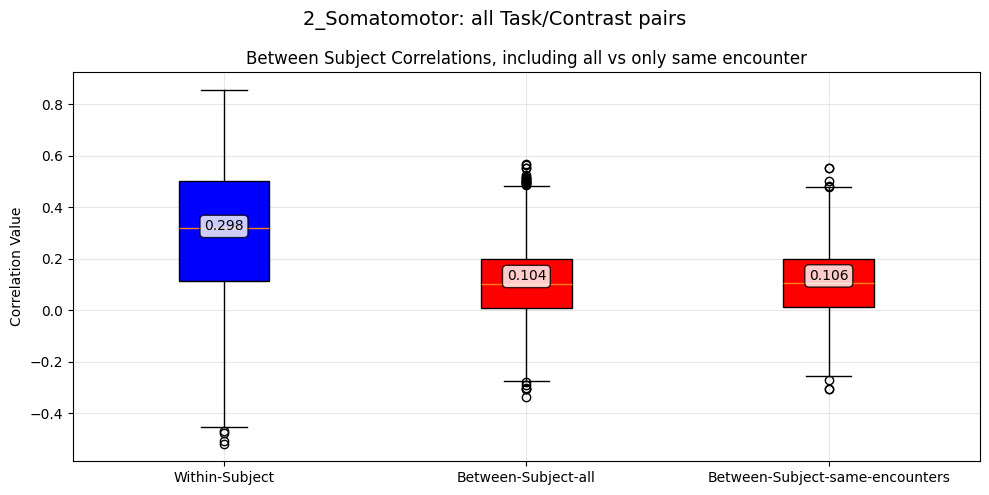

p = 4.89e-01


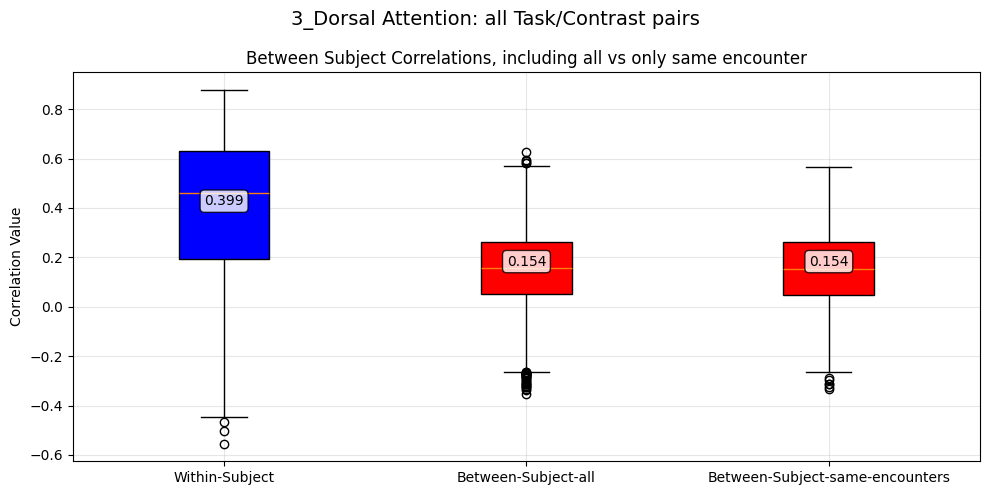

p = 9.98e-01


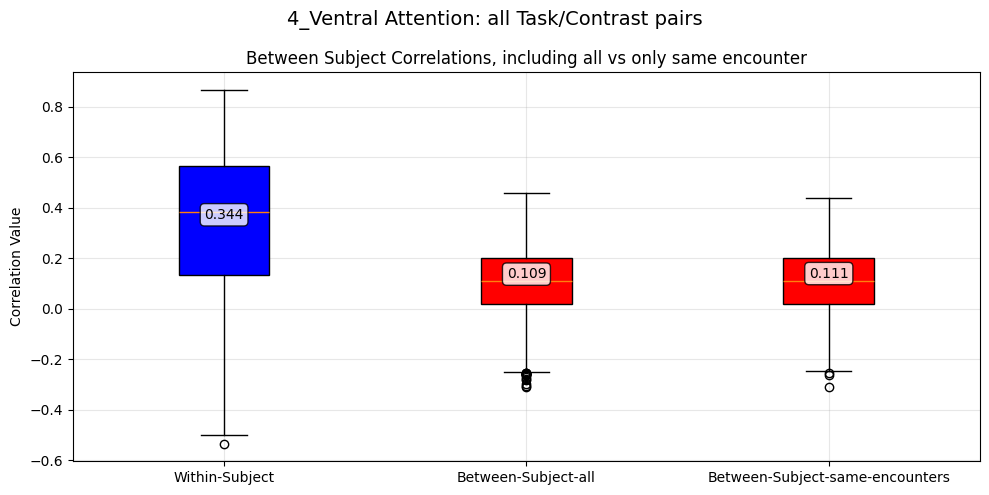

p = 4.45e-01


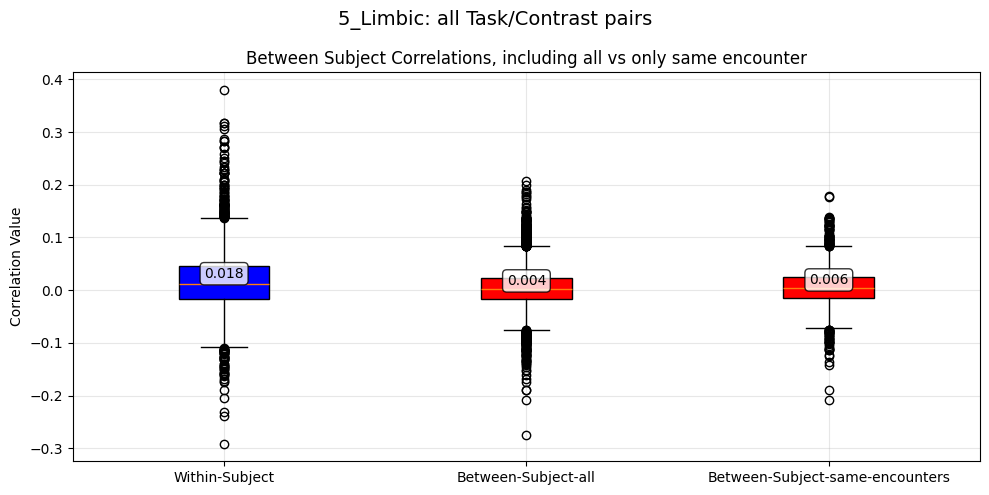

p = 2.90e-02


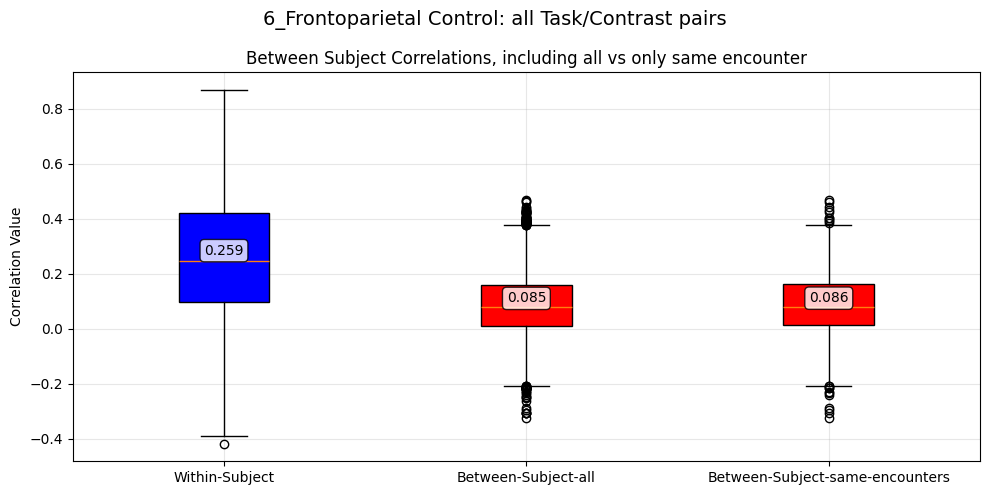

p = 7.69e-01


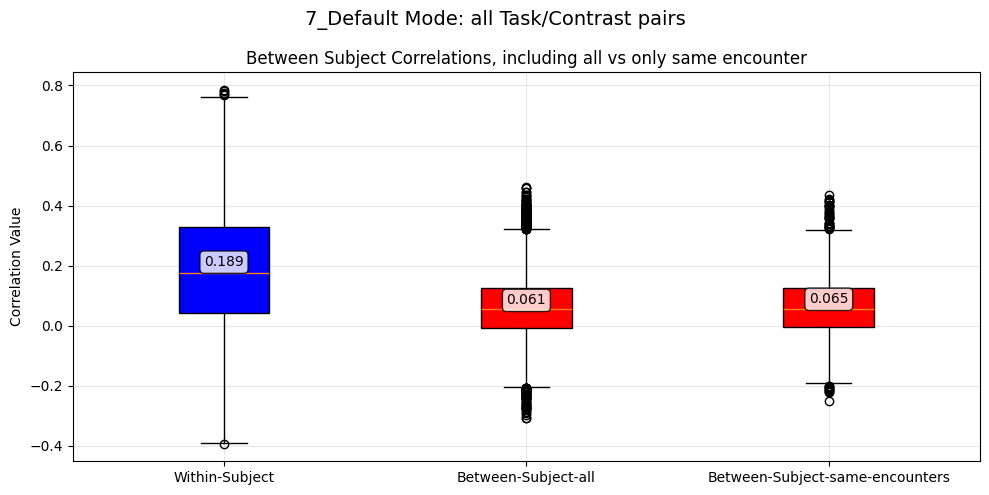

p = 1.50e-01


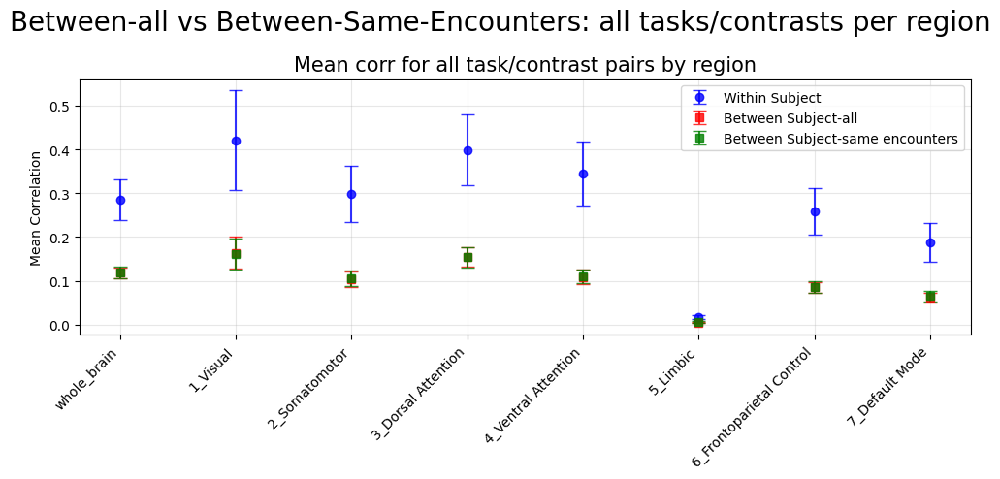

In [96]:
# plot boxplots for each region, comparing all between-subj vs between-subj only including the same encounters
for region in REGIONS:
    full_title = f"{region}: all Task/Contrast pairs" 
    
    fig, ax = plt.subplots(figsize=(10, 5))
    
    # Box plot
    box_data = [within_between_general_corrs["within"][region], within_between_general_corrs["between"][region], within_between_encounters_corrs["between"][region]]
    box_plot = ax.boxplot(box_data, tick_labels=['Within-Subject', 'Between-Subject-all', 'Between-Subject-same-encounters'], 
                          patch_artist=True)
    box_plot['boxes'][0].set_facecolor('blue')
    box_plot['boxes'][1].set_facecolor('red')
    box_plot['boxes'][2].set_facecolor('red')
    ax.set_ylabel('Correlation Value')
    ax.set_title('Between Subject Correlations, including all vs only same encounter')
    ax.grid(True, alpha=0.3)

    # mean labels
    for i, data in enumerate(box_data):
        mean_val = np.mean(data)
        ax.text(i+1, mean_val, f'{mean_val:.3f}', 
                horizontalalignment='center', verticalalignment='bottom',fontsize=10, 
                bbox=dict(boxstyle='round,pad=0.3', facecolor='white', alpha=0.8))
    ax.set_ylabel('Correlation Value')
    ax.set_title('Between Subject Correlations, including all vs only same encounter')
    ax.grid(True, alpha=0.3)

    
    fig.suptitle(full_title, fontsize=14)
    plt.tight_layout()
    plt.show()
    
    t_stat, p_val = stats.ttest_ind(within_between_general_corrs["between"][region], within_between_encounters_corrs["between"][region])
        
    print(f"p = {p_val:.2e}")


# make a plot where we can compare between-all vs between-same for all regions 
region_means = {"within":[], "between-all": [], "between-same-encounters":[]}
region_vars = {"within":[], "between-all": [], "between-same-encounters":[]}
region_labels = REGIONS

for region in region_labels:
    region_means["within"].append(np.mean(within_between_general_corrs["within"][region]))
    region_means["between-all"].append(np.mean(within_between_general_corrs["between"][region]))
    region_means["between-same-encounters"].append(np.mean(within_between_encounters_corrs["between"][region]))

    region_vars["within"].append(np.var(within_between_general_corrs["within"][region]))
    region_vars["between-all"].append(np.var(within_between_general_corrs["between"][region]))
    region_vars["between-same-encounters"].append(np.var(within_between_encounters_corrs["between"][region]))
    
fig, ax = plt.subplots(figsize=(10, 5))
fig.suptitle(f'Between-all vs Between-Same-Encounters: all tasks/contrasts per region', fontsize=20)
x_pos = np.arange(len(region_labels))

ax.errorbar(x_pos, region_means["within"], yerr=region_vars["within"], fmt='o', 
   color='blue', capsize=5, alpha=0.8, label='Within Subject')
ax.errorbar(x_pos, region_means["between-all"], yerr=region_vars["between-all"], fmt='s', 
   color='red', capsize=5, alpha=0.8, label='Between Subject-all')
ax.errorbar(x_pos, region_means["between-same-encounters"], yerr=region_vars["between-same-encounters"], fmt='s', 
   color='green', capsize=5, alpha=0.8, label='Between Subject-same encounters')

ax.set_ylabel('Mean Correlation')
ax.set_title(f'Mean corr for all task/contrast pairs by region', fontsize=15)
ax.set_xticks(x_pos)
ax.set_xticklabels(region_labels, rotation=45, ha='right', fontsize=10)
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


Looking at these comparisons, we can see that including same-encounters only for the between-subject correlations very slightly increases the value in many of the regions including whole brain (though not all of them). However any difference is very small, as the mean correlations still largely overlap. This result does not necessarily indicate that there are large time-effects, but it does not counteract it either.

Finally, we can do the same analysis we did previously, where we plot the task/contrast mean difference per region.

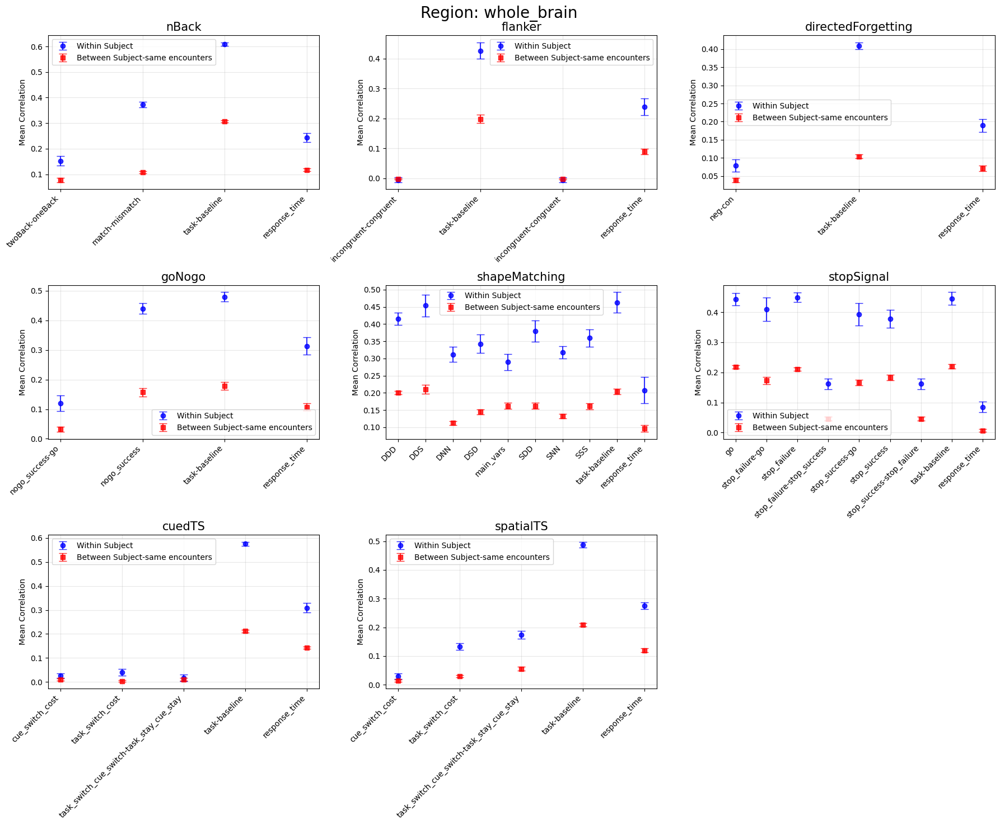

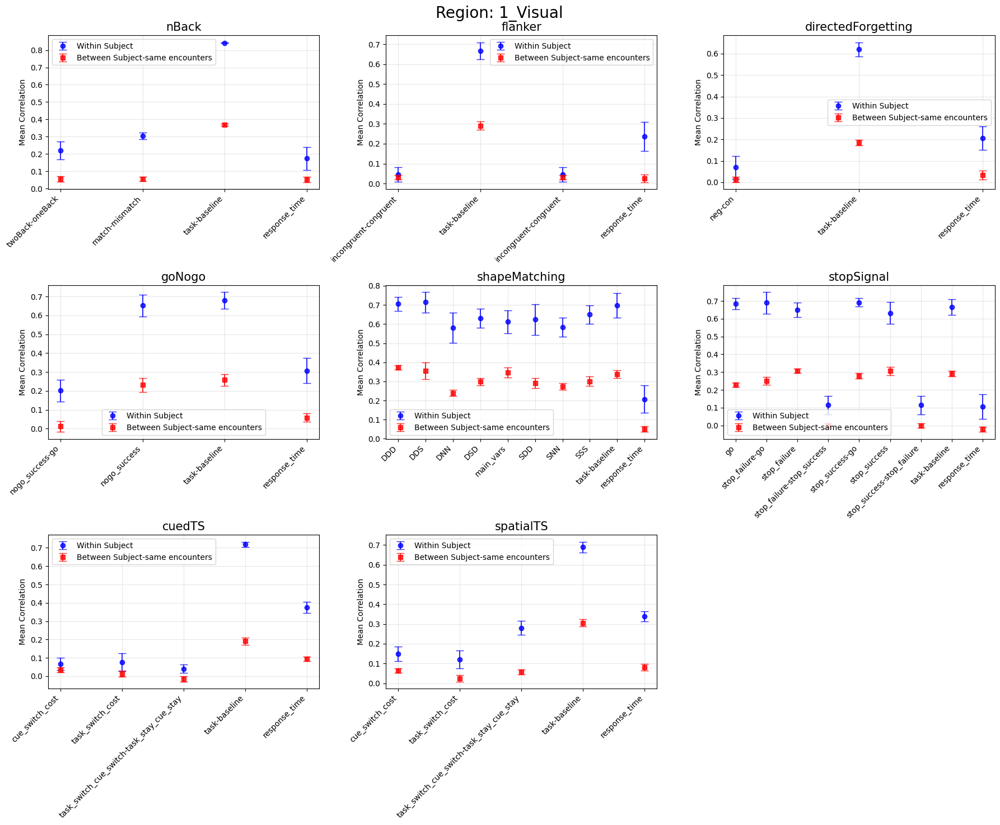

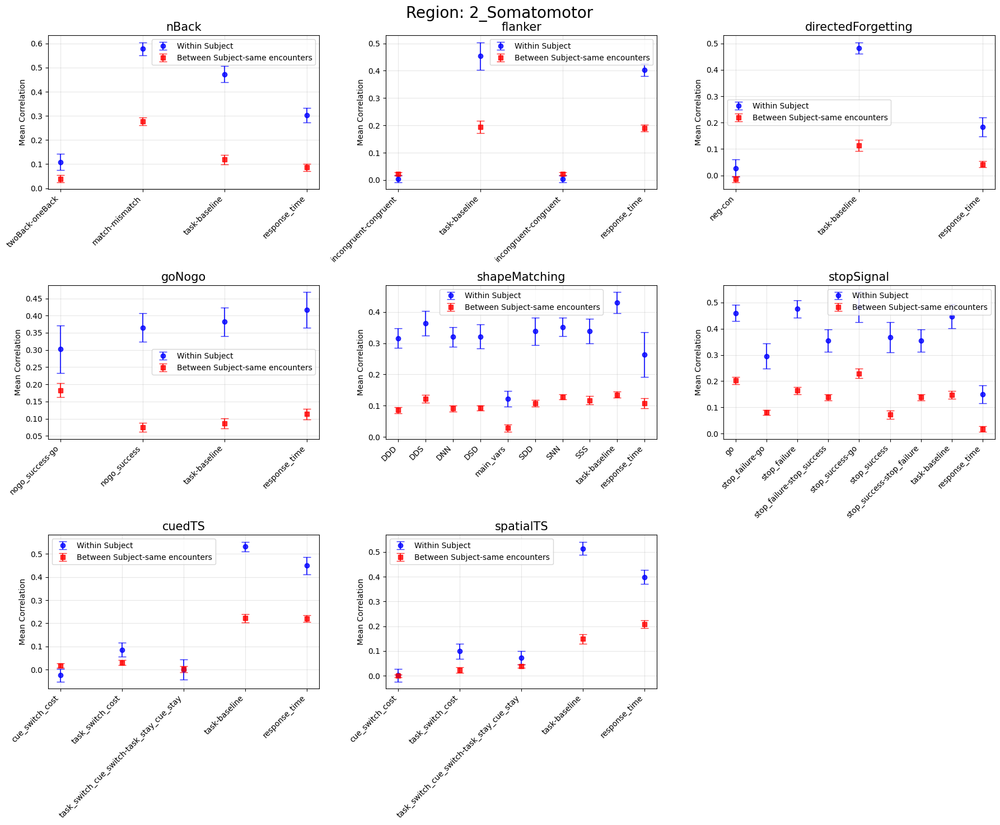

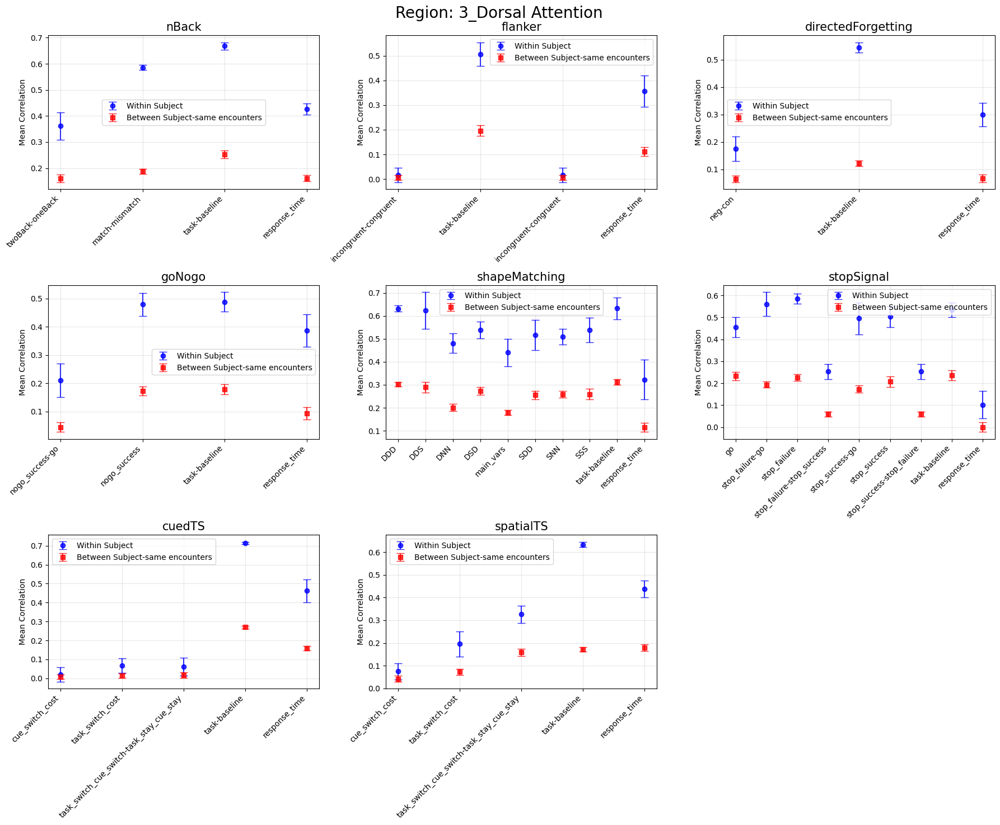

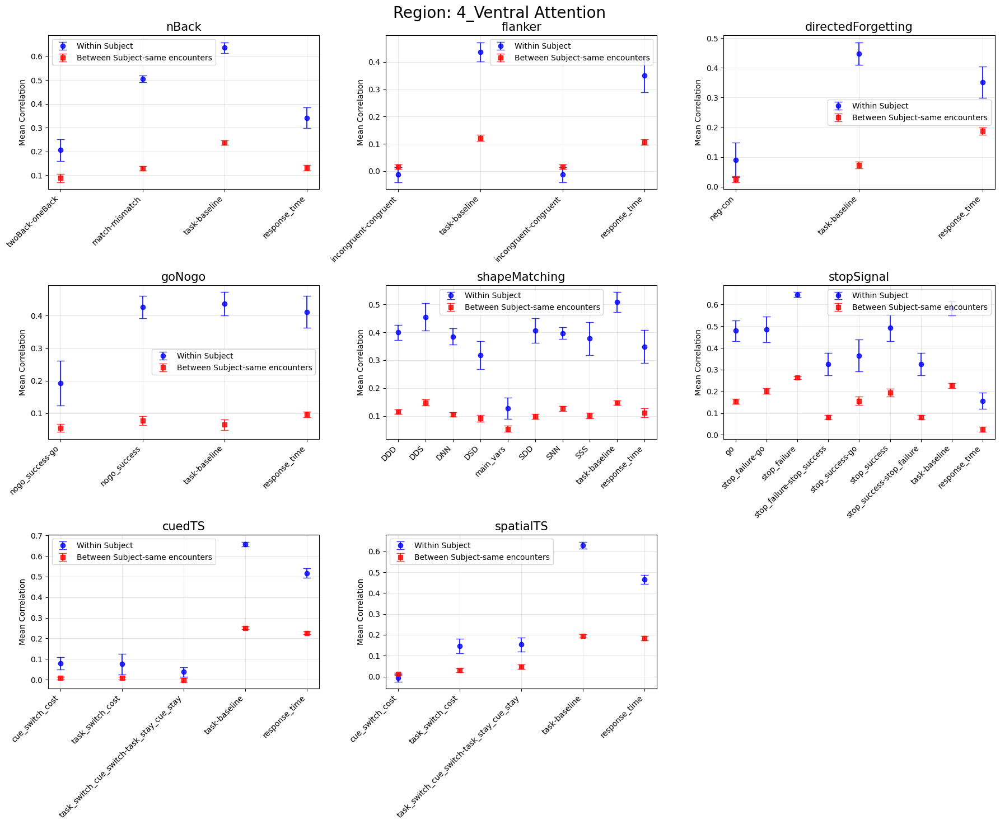

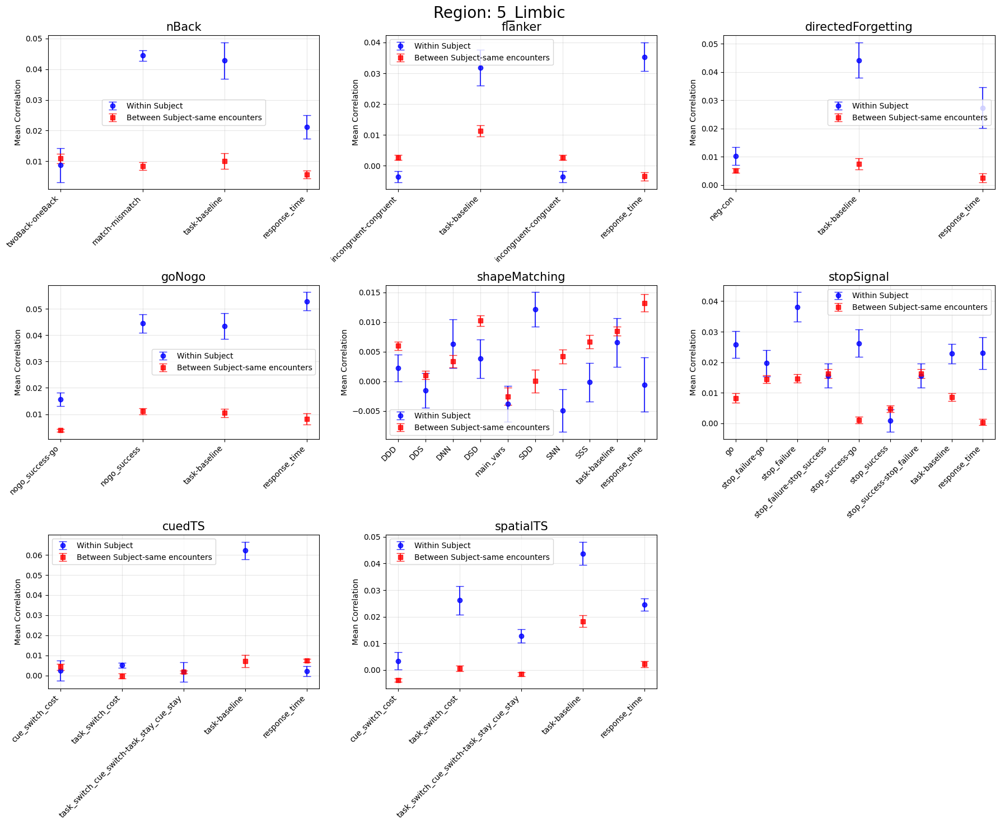

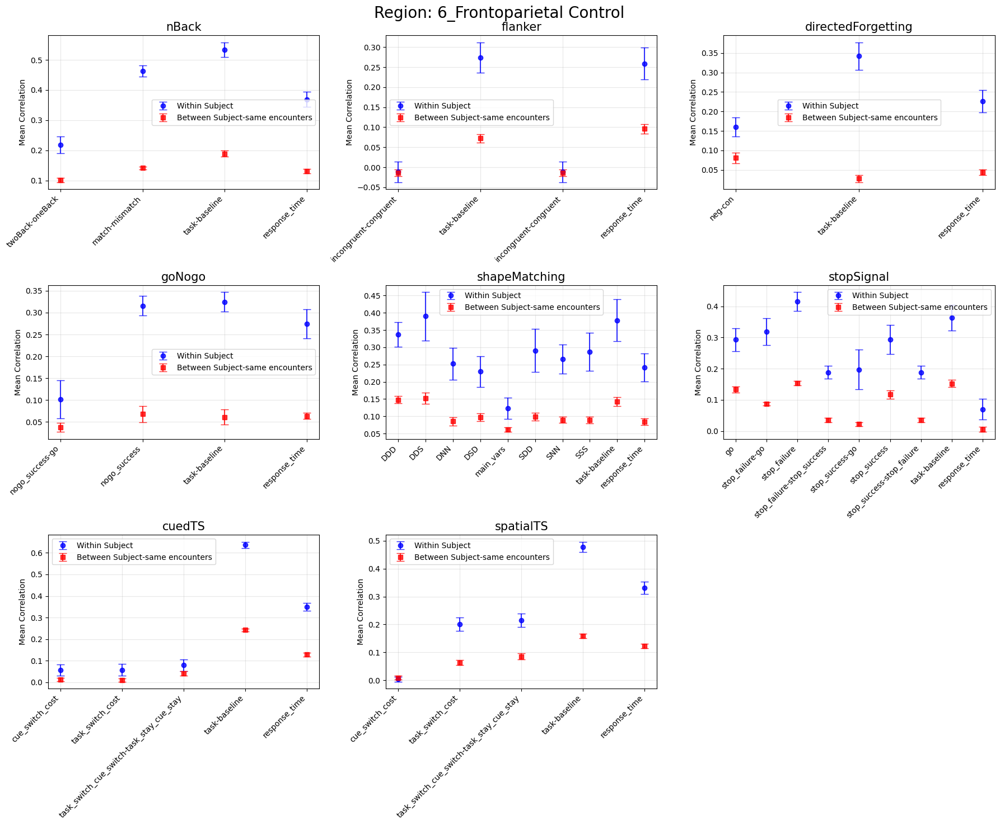

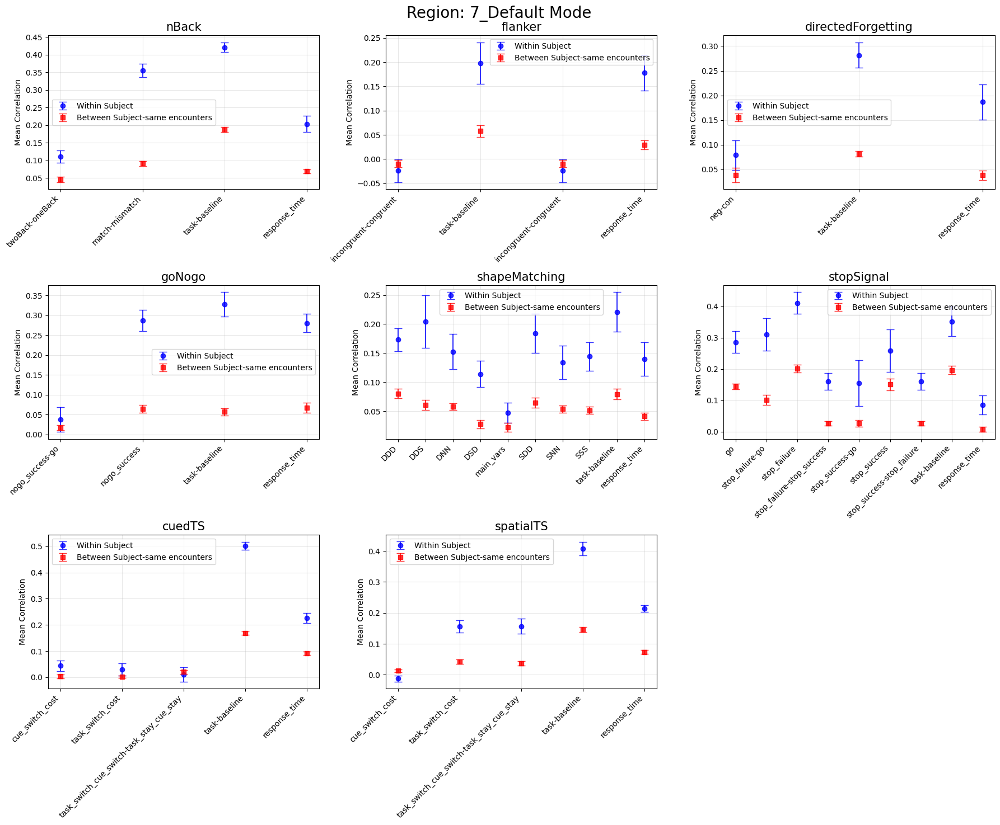

In [97]:
# make a plot where, per region/task, we can see the mean within and the mean between for each contrast 
for region in REGIONS:
    # Calc grid dimensions
    n_tasks = len(TASKS)
    n_cols = min(3, n_tasks)
    n_rows = math.ceil(n_tasks / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
    
    fig.suptitle(f'Region: {region}', fontsize=20)
    
    for i, task in enumerate(TASKS):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row, col] if n_rows > 1 else axes[col]
        
        contrasts = means[region][task]["contrast_name"]
        within_means = means[region][task]["within_mean"]
        between_means = means[region][task]["between_mean"]
        within_vars = means[region][task]["within_var"]
        between_vars = means[region][task]["between_var"]
        
        x_pos = np.arange(len(contrasts))

        ax.errorbar(x_pos, within_means, yerr=within_vars, fmt='o', 
           color='blue', capsize=5, alpha=0.8, label='Within Subject')
        ax.errorbar(x_pos, between_means, yerr=between_vars, fmt='s', 
           color='red', capsize=5, alpha=0.8, label='Between Subject-same encounters')
        
        ax.set_ylabel('Mean Correlation')
        ax.set_title(f'{task}', fontsize=15)
        ax.set_xticks(x_pos)
        ax.set_xticklabels(contrasts, rotation=45, ha='right', fontsize=10)
        ax.legend()
        ax.grid(True, alpha=0.3)

        # Hide unused subplots
        for i in range(len(TASKS), n_rows * n_cols):
            row = i // n_cols
            col = i % n_cols
            axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.show()

Looking at these, we can see that the patterns have now slightly changed; although for most datapoints the within-subject mean correlation is still larger than the between, even when we only include the same encounter, there now seem to be more cases where the between-subject mean correlation is slightly larger. While these figures are difficult to parse in a meaningful way, they provide a conclusion to 2) **In each of the Yeo networks and the whole brain, are subjects more correlated with themselves during other encounters of a given task/contrast, or with other subjects in the same encounter?** by suggesting that there may be encounter specific patterns at play which very slightly alter the between subject variability when looking at same encounter only; however, it is important to note that these results are not fully supportive as the difference is very small.

This conclusion provides more motivation for question 3) In each of the Yeo networks and the whole brain, how does the mean correlation between subjects in the same task/contrast/encounter number change across encounters. Do participants tend to get more or less similar to each other as they learn/practice the task?

# Section 2: using RSMs from first level contrast maps to understand how between-subject activation correlations fluctuate over encounters

We will now focus on this question using the first level maps:

3) **In each of the Yeo networks and the whole brain, how does the mean correlation between subjects in the same task/contrast/encounter number change across encounters. Do participants tend to get more or less similar to each other as they learn/practice the task?**

Based off of these reflections, we will look at **how the mean between-subject correlation changes across encounters. Do participants tend to get more or less similar to each other as they learn/practice the task?**

In [98]:
# for each region, go to the task/contrast and save the correlations for enc 0, enc 1, enc 2, etc to a list each
encounter_specific_corrs = {}
for region in REGIONS:
    encounter_specific_corrs[region] = {}

    for task in TASKS:
        encounter_specific_corrs[region][task] = {}

        for contrast in CONTRASTS[task]:
            encounter_specific_corrs[region][task][contrast] = {"1":[], "2":[], "3":[], "4":[], "5":[]}

            rsm_data = all_rsms[task][contrast][region]
            rsm_matrix = rsm_data['rsm']
            descriptors = rsm_data['descriptors']

            # label the data with which encounter each map belongs to
            encounter_map_indices = {}  # encounter_id -> [map indices]
            
            for i, desc in enumerate(descriptors):
                # format: descriptor_name = f"{subject}:encounter-0{encounter + 1}"
                encounter_id = desc.split('encounter-0')[1]
                
                if encounter_id not in encounter_map_indices:
                    encounter_map_indices[encounter_id] = []
                
                encounter_map_indices[encounter_id].append(i)
        
            upper_tri = np.triu_indices_from(rsm_matrix, k=1)
            all_correlations = rsm_matrix[upper_tri]
                        
            for idx, (row, col) in enumerate(zip(upper_tri[0], upper_tri[1])):
                # Find which encounters these two maps belong to
                enc_for_map_row = None
                enc_for_map_col = None
                
                for encounter_id, map_indices in encounter_map_indices.items():
                    if row in map_indices:
                        enc_for_map_row = encounter_id
                    if col in map_indices:
                        enc_for_map_col = encounter_id
                        
                # get the corr
                correlation_value = all_correlations[idx]
        
                # put the corr into assigned group
                # only include if its the same encounter both ways 
                if enc_for_map_row == enc_for_map_col:
                    # Same encounter
                    encounter_specific_corrs[region][task][contrast][enc_for_map_row].append(correlation_value)                    
                    

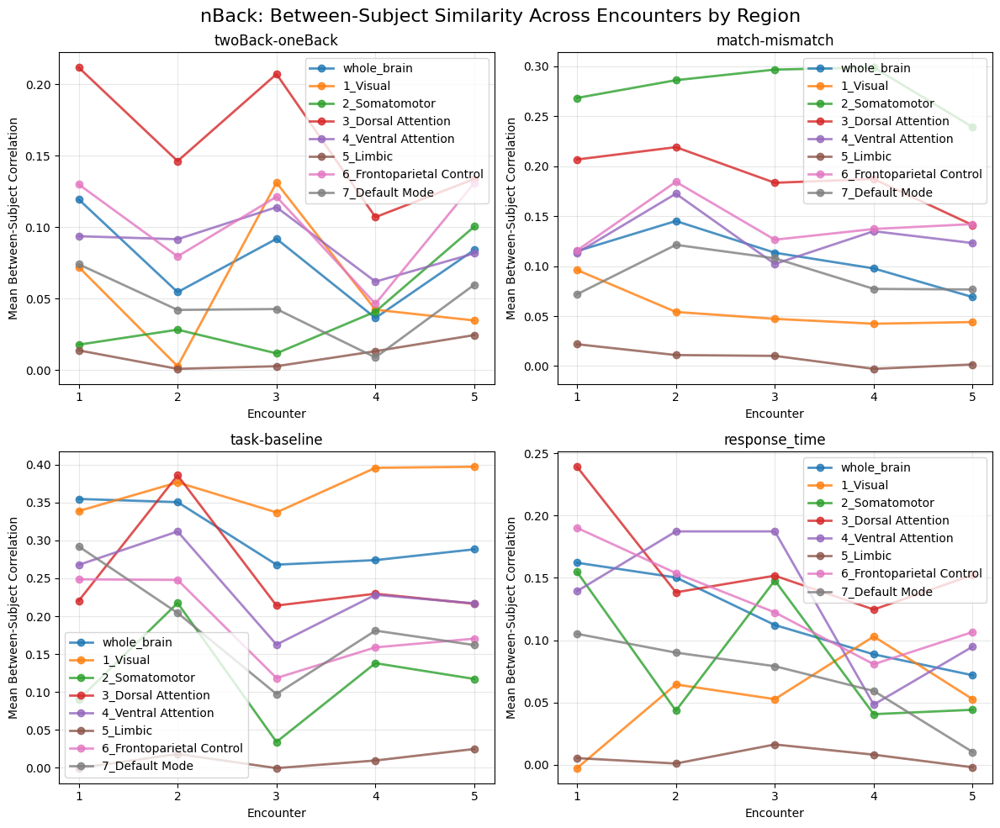

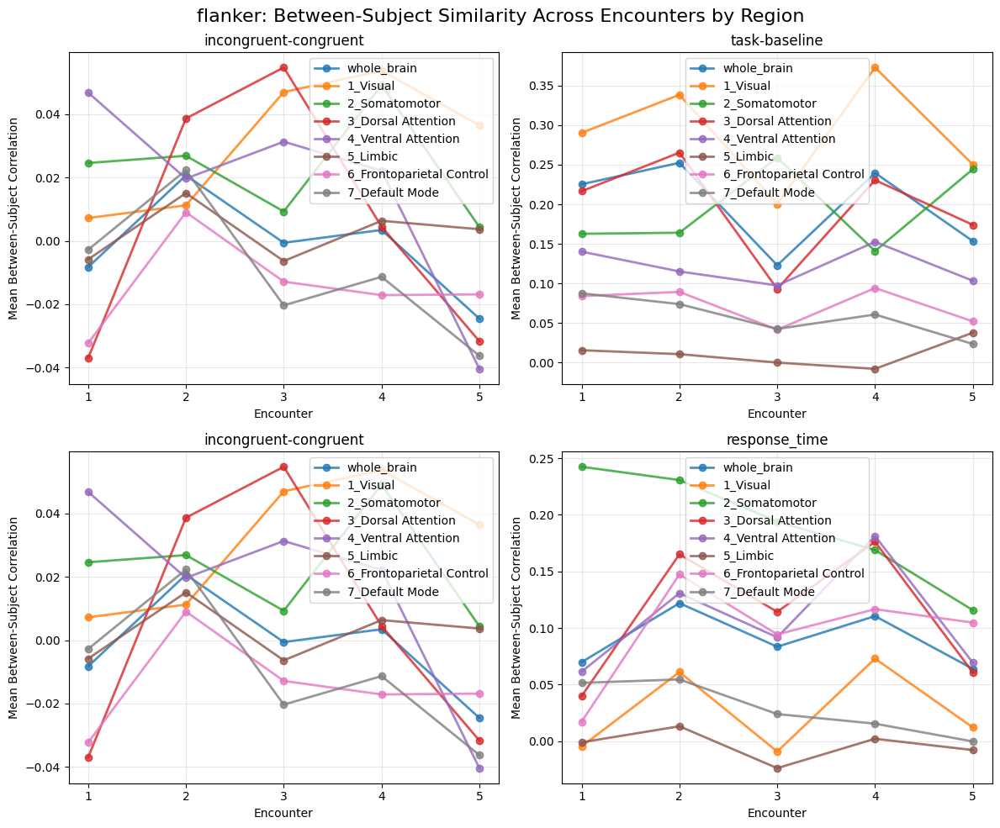

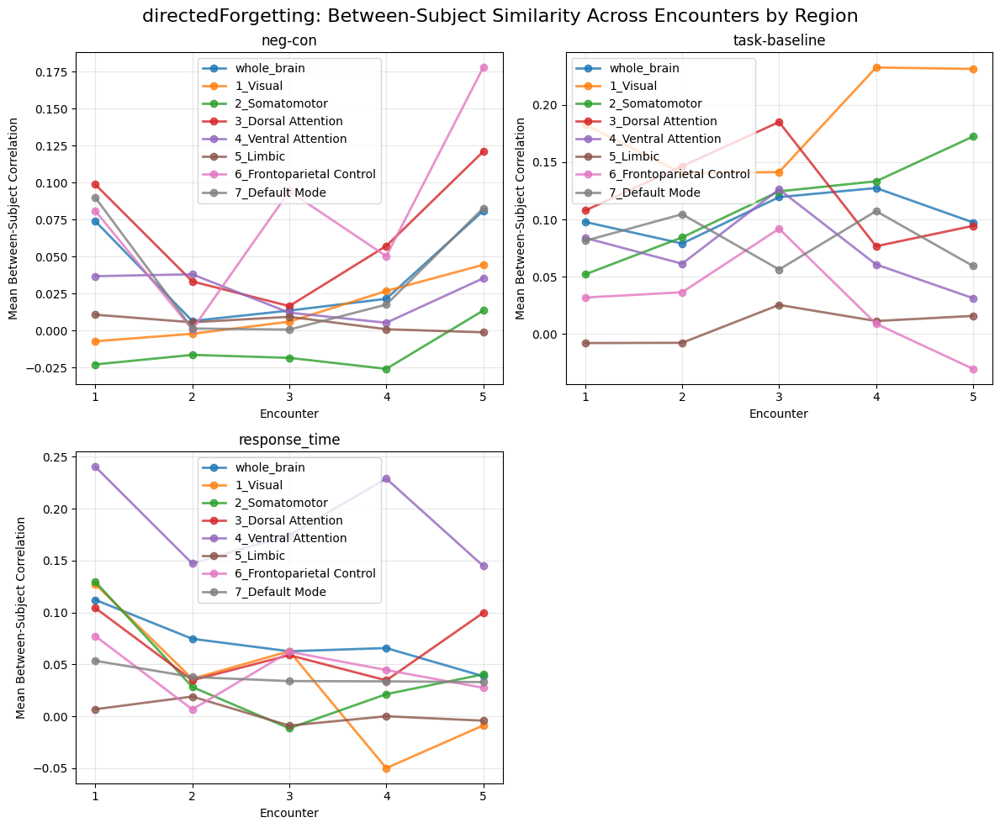

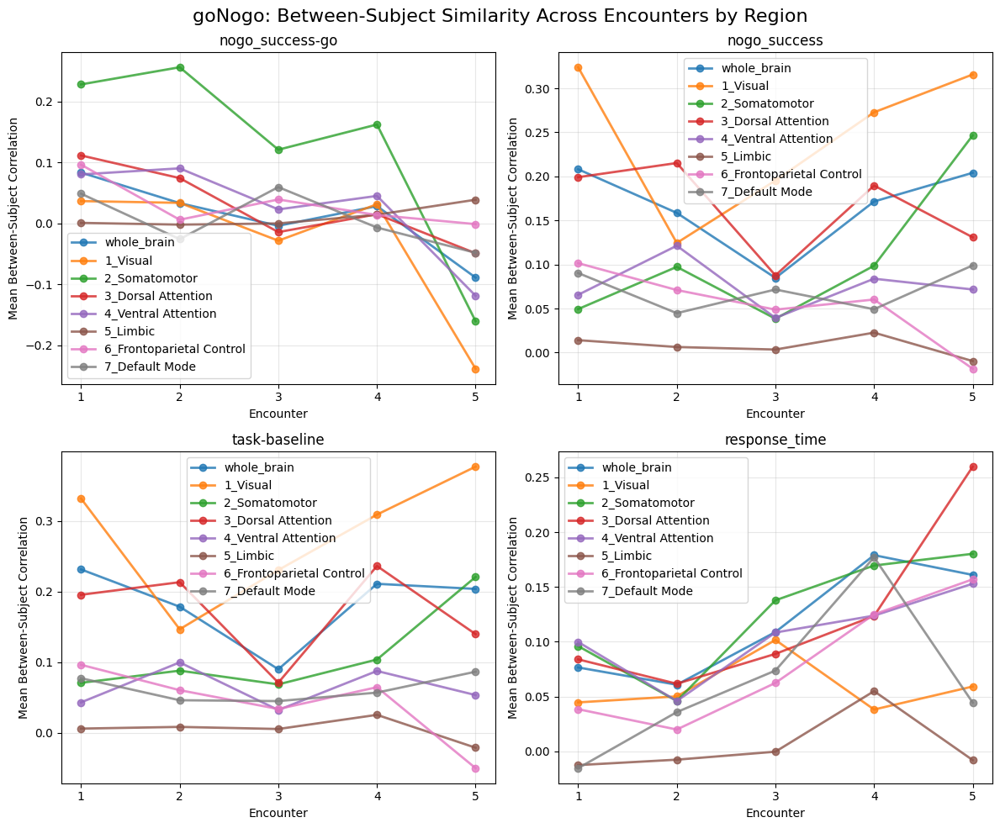

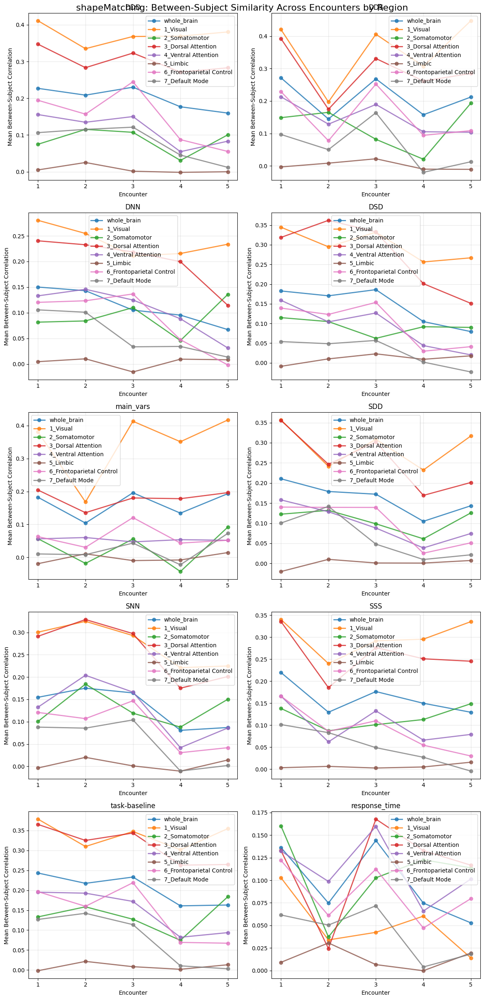

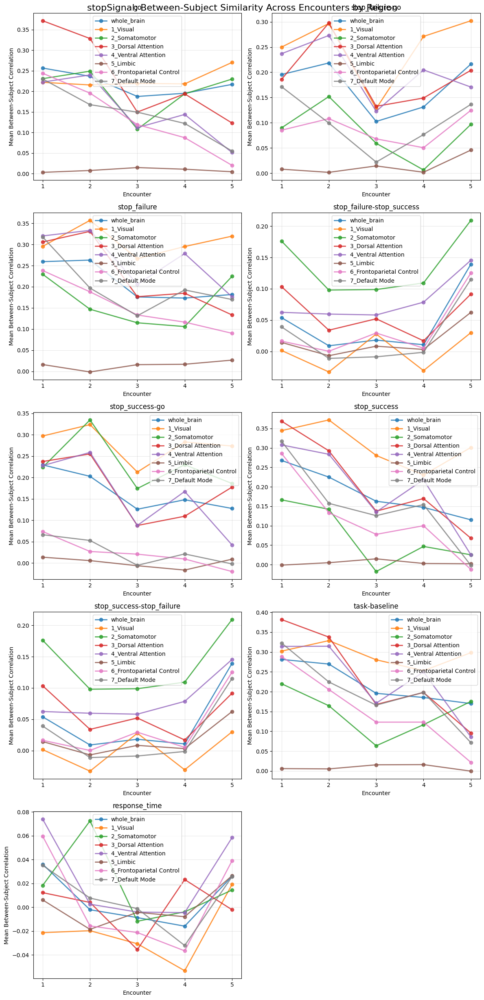

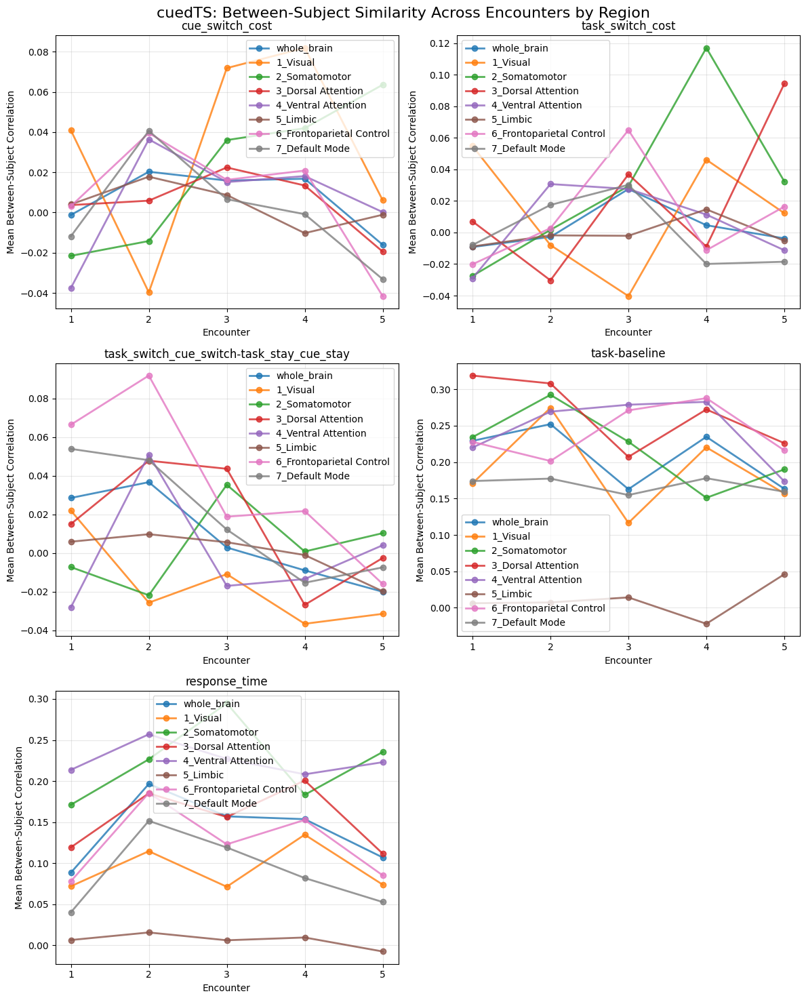

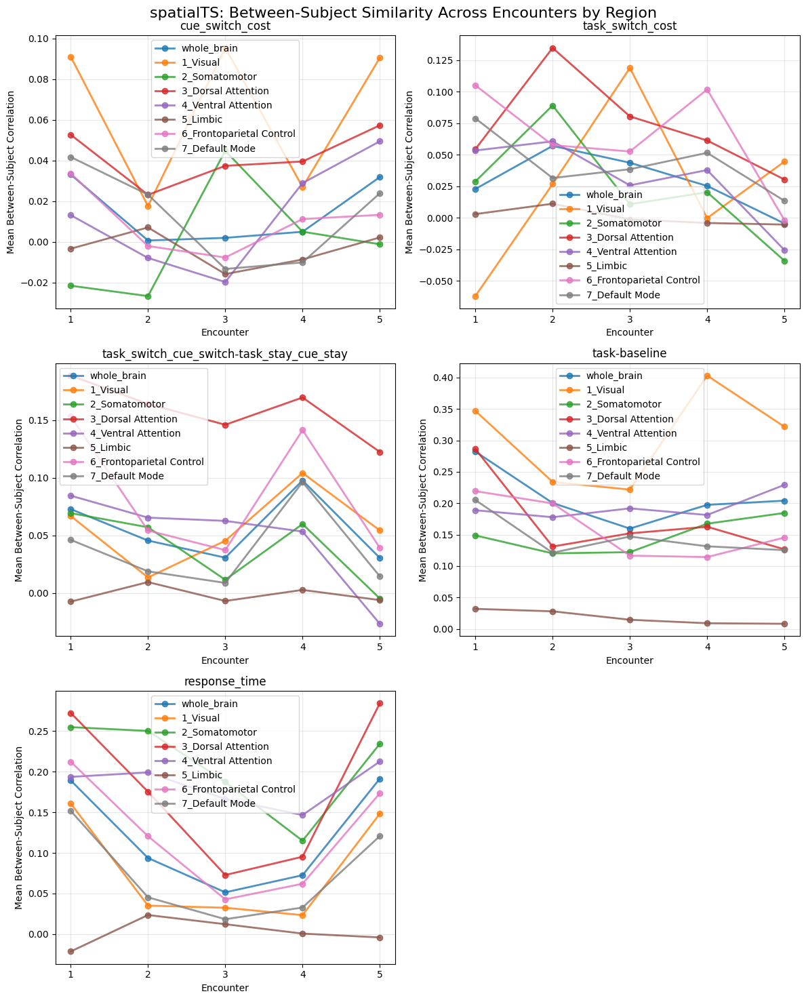

In [99]:
# Calculate mean between-subject correlation for each encounter (same as before)
encounter_means = {}
for region in REGIONS:
    encounter_means[region] = {}
    for task in TASKS:
        encounter_means[region][task] = {}
        for contrast in CONTRASTS[task]:
            encounter_means[region][task][contrast] = {}
            for encounter in ["1", "2", "3", "4", "5"]:
                corrs = encounter_specific_corrs[region][task][contrast][encounter]
                if corrs:
                    encounter_means[region][task][contrast][encounter] = np.mean(corrs)
                else:
                    encounter_means[region][task][contrast][encounter] = np.nan

# 1 plot per task/contrast with all regions
for task in TASKS:
    n_contrasts = len(CONTRASTS[task])
    n_cols = min(2, n_contrasts)
    n_rows = math.ceil(n_contrasts / n_cols)
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(6*n_cols, 5*n_rows))
    if n_contrasts == 1:
        axes = [axes]
    elif n_rows == 1:
        axes = axes.reshape(1, -1)
    
    for i, contrast in enumerate(CONTRASTS[task]):
        row = i // n_cols
        col = i % n_cols
        ax = axes[row, col]
        
        encounters = ["1", "2", "3", "4", "5"]
        
        # Plot each region as a separate line
        for region in REGIONS:
            means = [encounter_means[region][task][contrast][enc] for enc in encounters]
            ax.plot(encounters, means, 'o-', linewidth=2, markersize=6, 
                   label=region, alpha=0.8)
        
        ax.set_xlabel('Encounter')
        ax.set_ylabel('Mean Between-Subject Correlation')
        ax.set_title(f'{contrast}')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
    # Hide unused subplots
    for i in range(len(CONTRASTS[task]), n_rows * n_cols):
        row = i // n_cols
        col = i % n_cols
        axes[row, col].axis('off')
    
    fig.suptitle(f'{task}: Between-Subject Similarity Across Encounters by Region', fontsize=16)
    plt.tight_layout()
    plt.show()

Looking at these graphs, it is difficult to parse so many lines and data, but it is clear that while for some task/contrast groupings the region encounter patterns are moving in very different directions, for some of them it seems like several of the networks are moving in similar patterns. Additionally, looking at this visually, it seems as if there are encounter-specific effects occuring across the networks--with between subject correlations changing depending on encounter number.

Now, let's look at two examples which seem to have semi cohesive trends across networks.

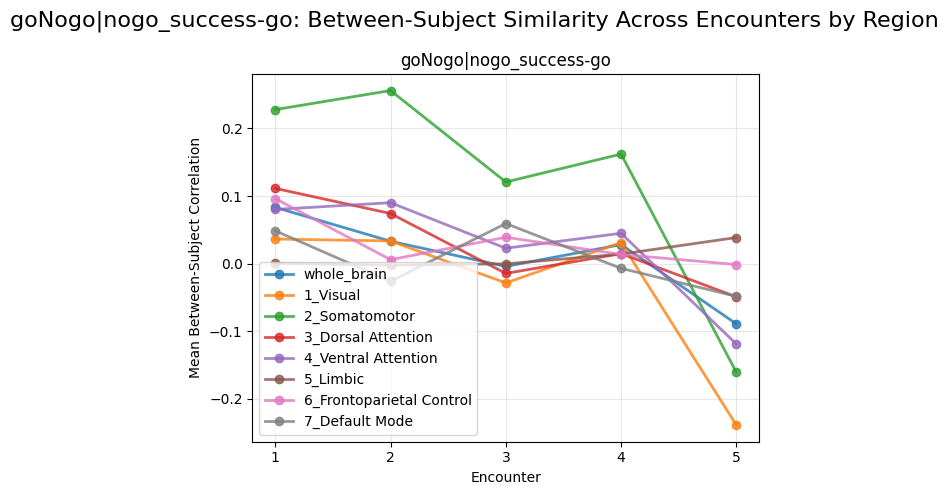

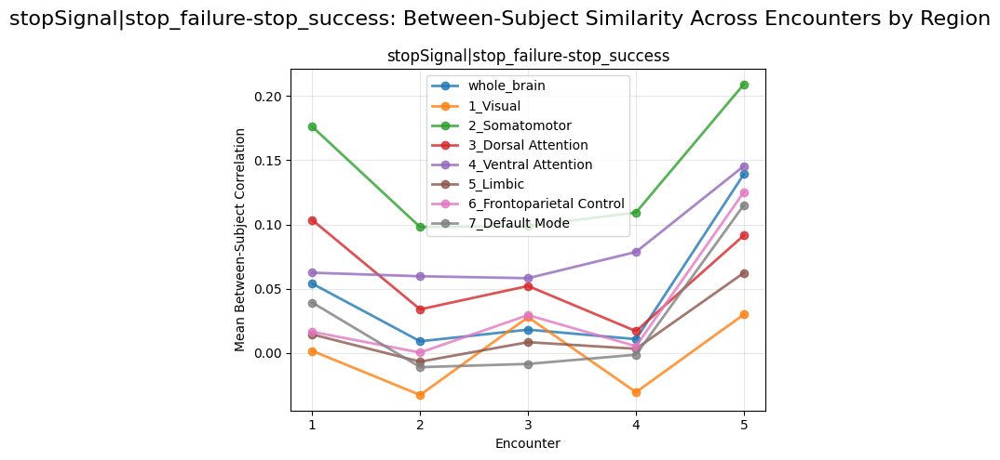

In [100]:
tasks_trends = ["goNogo", "stopSignal"]
contrasts_trends = ["nogo_success-go","stop_failure-stop_success"]


for task in tasks_trends:
    for contrast in contrasts_trends:
        if contrast not in CONTRASTS[task]:
            continue
        fig, ax = plt.subplots(figsize=(6, 5))
    
        encounters = ["1", "2", "3", "4", "5"]
    
        for region in REGIONS:
            means = [encounter_means[region][task][contrast][enc] for enc in encounters]
            ax.plot(encounters, means, 'o-', linewidth=2, markersize=6, 
                   label=region, alpha=0.8)
        
        ax.set_xlabel('Encounter')
        ax.set_ylabel('Mean Between-Subject Correlation')
        ax.set_title(f'{task}|{contrast}')
        ax.legend()
        ax.grid(True, alpha=0.3)
    
        fig.suptitle(f'{task}|{contrast}: Between-Subject Similarity Across Encounters by Region', fontsize=16)
        plt.tight_layout()
        plt.show()

Interestingly, in the goNoGo example, all of the regions seem to become less correlated with other subjects as the encounter number increases. This suggests that there may be changes occuring from practice that make subjects have less similar strategies to each other. In the stopSignal example, however, it seems as if for many of the regions there is a slight decrease in between subject similarity before going back up. While this can definitely be noise and is not fully interpretable, looking at the discovery sample in this way will help create interesting analyses for a larger sample later on.

We can also look at whole-brain only, across all task-baseline.

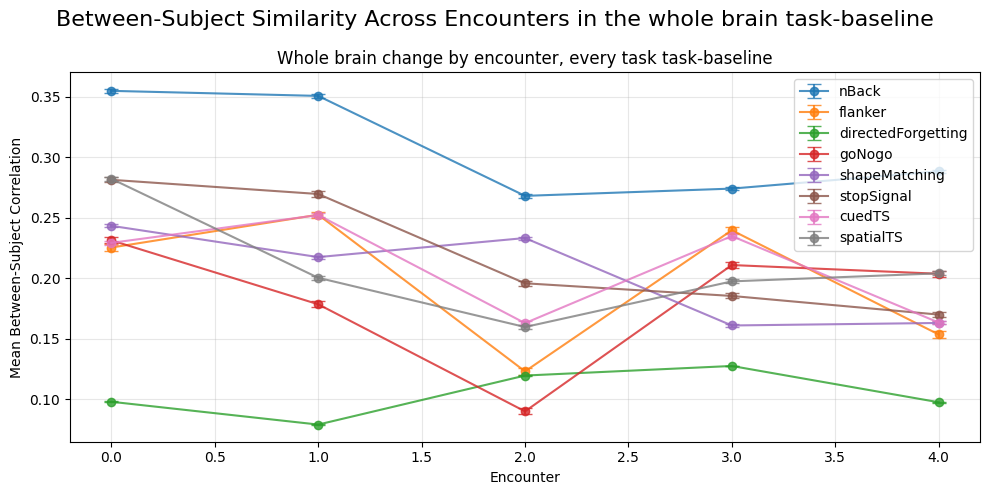

In [101]:
task_trends = TASKS
contrast = "task-baseline"
region = "whole_brain"

# plot it
fig, ax = plt.subplots(figsize=(10, 5))

ax.set_xlabel('Encounter')
ax.set_ylabel('Mean Between-Subject Correlation')
ax.set_title(f'Whole brain change by encounter, every task task-baseline')

encounters = ["1", "2", "3", "4", "5"]
x_pos = np.arange(len(encounters)) 

for task in task_trends:
    means = [encounter_means[region][task][contrast][enc] for enc in encounters]
    vars = np.var(means)
    ax.errorbar(x_pos, means, yerr=vars, fmt='o', linestyle='-', capsize=5, alpha=0.8, label=f'{task}')

ax.legend()
ax.grid(True, alpha=0.3)
fig.suptitle(f'Between-Subject Similarity Across Encounters in the whole brain {contrast}', fontsize=16)
plt.tight_layout()
plt.show()

Looking at this, it is evident that there is no single pattern ocurring, and suggests that practice and time may be affecting different tasks differently. Flanker, cuedTS, and goNogo seem to have similar up and down patterns--but again this is qualitative. Additionally, it looks like in general the correlations at encounter 5 are smaller than at encounter 1. 

While this is difficult to quantify with such a small sample, one final way we can begin getting at our question (**In each of the Yeo networks and the whole brain, how does the mean correlation between subjects in the same task/contrast/encounter number change across encounters. Do participants tend to get more or less similar to each other as they learn/practice the task?**) is by looking at changes in between-subject correlations at each encounter. For interpretability, we can just do this for the whole brain correlations and can see how much participants tend to converge or diverge per increase in encounter with a task using linear regression.

nBack|response_time negative sig
directedForgetting|response_time negative sig
goNogo|response_time positive sig
shapeMatching|DNN negative sig
stopSignal|stop_success negative sig
stopSignal|task-baseline negative sig
cuedTS|task_switch_cue_switch-task_stay_cue_stay negative sig


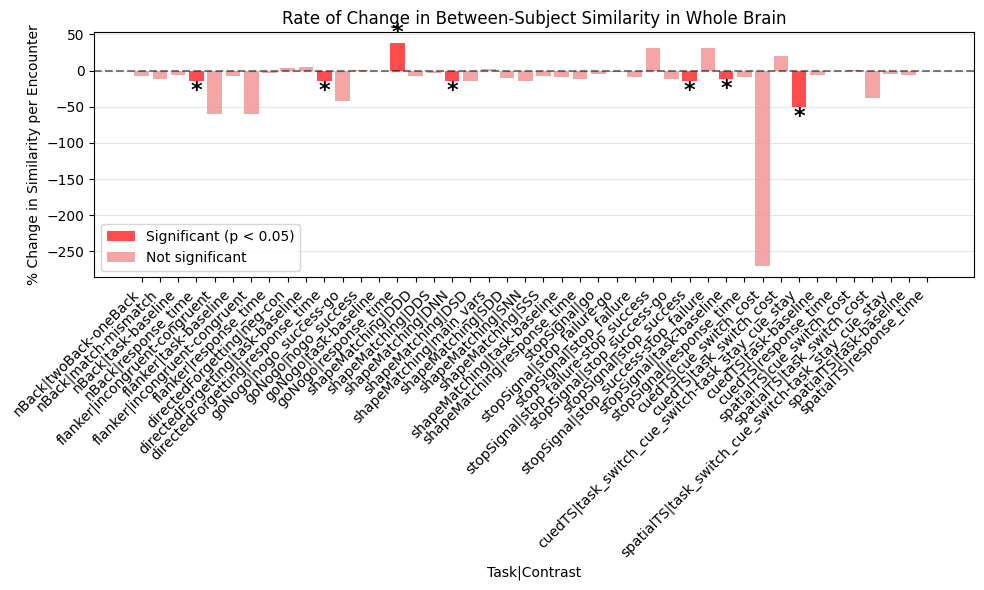

In [102]:
# calculate and plot this percent change in corrs using linear regression

# organize the data to isolate whole brain encounter mean corrs
whole_brain_encounter_means = {}
for task in TASKS:
    whole_brain_encounter_means[task] = {}
    for contrast in CONTRASTS[task]:
        whole_brain_encounter_means[task][contrast] = {}
        
        for encounter in ["1", "2", "3", "4", "5"]:
            corrs = encounter_specific_corrs["whole_brain"][task][contrast][encounter]
            whole_brain_encounter_means[task][contrast][encounter] = np.mean(corrs)

# get the slopes and plot
slope_data = []
for task in TASKS:
    for contrast in CONTRASTS[task]:
        encounters = [1, 2, 3, 4, 5]
        means = [whole_brain_encounter_means[task][contrast][str(enc)] for enc in encounters]
        
        valid_data = [(enc, mean) for enc, mean in zip(encounters, means) if not np.isnan(mean)]
        x_vals, y_vals = zip(*valid_data)
        slope, intercept, r_value, p_value, std_err = stats.linregress(x_vals, y_vals) # fit linear regression
        
        # Convert to percentage change per encounter
        initial = y_vals[0] if y_vals[0] != 0 else 0.001
        slope_percent = (slope / abs(initial)) * 100
        
        slope_data.append({
            'name': f'{task}|{contrast}',
            'slope_percent': slope_percent,
            'p_value': p_value,
            'r_squared': r_value**2,
            'significant': p_value < 0.05
        })

        if (p_value < 0.05 and slope_percent > 0):
            print(f'{task}|{contrast} positive sig')
        elif (p_value < 0.05 and slope_percent < 0):
            print(f'{task}|{contrast} negative sig')

# Plot
fig, ax = plt.subplots(figsize=(10, 6))

conditions = [d['name'] for d in slope_data]
slopes = [d['slope_percent'] for d in slope_data]
colors = ['red' if d['significant'] else 'lightcoral' for d in slope_data]

bars = ax.bar(range(len(conditions)), slopes, color=colors, alpha=0.7)

# Add horizontal line at zero
ax.axhline(y=0, color='black', linestyle='--', alpha=0.5)

# Add sig markers
for i, d in enumerate(slope_data):
    if d['significant']:
        ax.text(i, slopes[i] + (0.1 if slopes[i] > 0 else -0.1), 
               '*', ha='center', va='bottom' if slopes[i] > 0 else 'top', 
               fontsize=16, fontweight='bold')

ax.set_xlabel('Task|Contrast')
ax.set_ylabel('% Change in Similarity per Encounter')
ax.set_title('Rate of Change in Between-Subject Similarity in Whole Brain')
ax.set_xticks(range(len(conditions)))
ax.set_xticklabels(conditions, rotation=45, ha='right')
ax.grid(True, alpha=0.3, axis='y')

# Add legend
legend_elements = [Patch(facecolor='red', alpha=0.7, label='Significant (p < 0.05)'),
                  Patch(facecolor='lightcoral', alpha=0.7, label='Not significant')]
ax.legend(handles=legend_elements)

plt.tight_layout()
plt.show()

Looking at this, we can see that in the whole brain RSM there seems to be a qualitative trend towards divergence in between participant similarity as the encounter number increases. However, most of these changes are not significant. Notably, in goNogo response time there seems to be the largest significant increase in between participant convergence, while for nBack response_time, directed forgetting response time, shapeMatching DNN, stopSignal stop_success, stopSignal task-baseline, and cuedTS task_switch_cue_switch-task_stay_cue_stay there is a significant increase in between participant divergence.

Overall, for question **3) In each of the Yeo networks and the whole brain, how does the mean correlation between subjects in the same task/contrast/encounter number change across encounters. Do participants tend to get more or less similar to each other as they learn/practice the task?** we can conclude that the effect of task encounters on between-participant similarity heavily depends on the region and task/contrast, although in the whole brain it seems as if--despite some significant increase in convergence--more encounters primarily lead to increased between-subject divergence. 

Additionally, we can conclude that there is definitely an impact and fluctuation pattern on specific networks--although this depends on the task/contrast--and as a result, it will be interesting in the future to quantify the patterns of networks fluctuating and changing together as subjects gain experience in a task.

# Discussion and summary:

### Summary of results

In this exploratory analysis, we used RSA matrices to develop a better understanding of the following 3 questions:

1) **Are subjects more correlated with themselves than with other subjects? How consistent is this pattern across regions, tasks, and contrasts?**
2) **In each of the Yeo networks and the whole brain, are subjects more correlated with themselves during other encounters of a given task/contrast, or with other subjects in the same encounter?** 
3) **In each of the Yeo networks and the whole brain, how does the mean correlation between subjects in the same task/contrast/encounter number change across encounters. Do participants tend to get more or less similar to each other as they learn/practice the task?**

For 1):
- we found that subjects consistently had significantly higher within-subject correlations than between-subject correlations, and that this pattern was consistent across the whole brain and the Yeo networks. When looking at task/contrast/network groupings specifically, however, we found that in certain Yeo networks (i.e. the Limbic and Frontoparietal control networks) this is not true for every task/contrast pair.

For 2):
- we found that subjects tended to still be correlated higher with themselves than with other subjects in the same task encounter, although for many of the networks the between-subject correlation that only considered subjects in the same task encounter was slightly higher than when considering all between-subject correlations. However, these differences were not significant.

For 3):
- we found that for each network/task/contrast grouping there were fluctuations in between-subject correlations over time. However, while qualitatively there were certain task/contrast pairings where the network patterns were more cohesive, it is unclear what the quantitative pattern is as of now. 
- we also found that in the whole brain, participants generally tend to get less similar to others as they encounter more of the task (with several significant task/contrast results), however there are a few exceptions to this (in particular, in the nBack response time contrast participants seemed to get significantly mroe similar over time).


### Conclusion

In conclusion, we found that in general, participants were significantly more correlated with themselves than with other participants--a fact that remained true even when only considering other participants in the same task encounter number. We looked at this in the whole brain as well as across different Yeo networks, and generally found this pattern to remain consistent (with some specific network/task/contrast combination exceptions). 

Additionally, we explored our main aim which was understanding how practice and experience with a task may change participants' neural representations. In doing so, we found that between-subject correlations in specific Yeo networks fluctuated over time as subjects encountered the tasks, in ways that may suggest changes in load across different networks (although this was not quantiatively examiend yet). Finally, we found that in the whole brain data, there was a general (although not for every task/contrast) increase towards dissimilarity with other participants following more task encounters (a significant result for certain task/contrast pairs). Overall, this was exploratory work with a discovery sample that has shown us there are potentially interesting time-series effects to explore in this data and the broader sample.

# Archive of code (some of this was taken from class notebooks)

In [ ]:
# # load second level zmaps for all tasks and contrasts
# def load_zmaps_with_metadata(input_dir):
#     """
#     Load z-statistic maps and their metadata.
    
#     Parameters:
#     -----------
#     input_dir : str
#         Directory where files were saved.
        
#     Returns:
#     --------
#     dict
#         Nested dictionary containing loaded NIFTI images and metadata, organized by task, contrast, and encounter.
#     """
#     # Initialize nested defaultdict to store the loaded data
#     loaded_data = defaultdict(lambda: defaultdict(dict))
    
#     # Track number of files loaded
#     num_files_loaded = 0
    
#     # Walk through the directory structure
#     for task_name in os.listdir(input_dir):
#         task_dir = os.path.join(input_dir, task_name)
        
#         # Skip if not a directory
#         if not os.path.isdir(task_dir):
#             continue
            
#         for contrast_name in os.listdir(task_dir):
#             contrast_dir = os.path.join(task_dir, contrast_name)
            
#             # Skip if not a directory
#             if not os.path.isdir(contrast_dir):
#                 continue
                
#             # Find all .nii.gz files in this contrast directory
#             for filename in os.listdir(contrast_dir):
#                 if filename.endswith('.nii.gz'):
#                     # Extract base filename without extension
#                     base_filename = filename.replace('.nii.gz', '')
                    
#                     # Check if corresponding JSON metadata exists
#                     json_path = os.path.join(contrast_dir, f"{base_filename}.json")
#                     if not os.path.exists(json_path):
#                         print(f"Warning: No metadata found for {filename}")
#                         continue
                    
#                     # Load image
#                     img_path = os.path.join(contrast_dir, filename)
#                     zmap = nib.load(img_path)
                    
#                     # Load metadata
#                     with open(json_path, 'r') as f:
#                         metadata = json.load(f)
                    
#                     # Get encounter index (0-based)
#                     encounter_idx = metadata["EncounterNumber"] - 1
                    
#                     # Store both the image and metadata
#                     loaded_data[task_name][contrast_name][encounter_idx] = {
#                         'zmap': zmap,
#                         'metadata': metadata
#                     }
                    
#                     num_files_loaded += 1
    
#     print(f"Loaded {num_files_loaded} z-statistic maps with metadata.")
#     return loaded_data

In [ ]:
# unneccesary for now
# second_level_encounter_zmaps = load_zmaps_with_metadata(INPUT_DIR) # need to add ['zmap'] to access actual maps

In [ ]:
# def RSA_reliability(RSA_all, k=1, shuffle=False):
#     # Do an ISC style analysis of the RSA matrix to test whether individuals are similar to the average
#     # RSA_all is an NxNxP array where N is the number of categories, and P is the number of participants.
#     # k is the distance from the diagonal that we will use for finding the off diagonal
#     # shuffle determines whether to scramble the order of the vectors so that your correlation represents a test of the null.
    
#     for ppt_counter in range(RSA_all.shape[2]):

#         RSA = RSA_all[:, :, ppt_counter]

#         # Convert the off-diagonal into a vector
#         RSA_vec = np.triu(RSA, k=k).flatten()

#         # Remove the zeroed values
#         RSA_vec = RSA_vec[RSA_vec != 0]
        
#         # Set the array
#         if ppt_counter == 0:
#             RSA_vecs = np.zeros((RSA_all.shape[2], len(RSA_vec)))

#         # Store the off diagonals
#         RSA_vecs[ppt_counter, :] = RSA_vec

#     # Now do leave one out comparisons
#     isc = []
#     for ppt_counter in range(RSA_all.shape[2]):

#         # Get all the participants but the one you are testing
#         loo_ppts = np.setdiff1d(np.arange(0, RSA_all.shape[2]), ppt_counter)

#         # What is the average of the LOO participants
#         av_vecs = np.mean(np.arctanh(RSA_vecs[loo_ppts, :]), 0)
        
#         # Get the vector for this participant
#         ppt_vec = RSA_vecs[ppt_counter, :]
        
#         # If true, then you will shuffle the participant vector, creating a null that can be used for reference
#         if shuffle == True:
#             np.random.shuffle(ppt_vec)
        
#         isc += [np.corrcoef(av_vecs, ppt_vec)[0, 1]]
    
#     # Return the ISC values
#     return isc

In [ ]:
# Run the code
# isc = RSA_reliability(RSA_all)
# print('Mean ISC: %0.2f (range: %0.2f -- %0.2f)' % (np.mean(isc), np.min(isc), np.max(isc)))

In [ ]:
# # Insert code here
# isc_shuffled = RSA_reliability(RSA_all, shuffle=True)
# print('Mean ISC: %0.2f (range: %0.2f -- %0.2f)' % (np.mean(isc_shuffled), np.min(isc_shuffled), np.max(isc_shuffled)))

# # plotting
# plt.hist(isc_shuffled, label='shuffled isc values')
# plt.hist(isc, label='real isc values')
# plt.title('Histogram of isc values post-shuffling and the non-shuffled isc values')
# plt.xlabel('Value')
# plt.ylabel('Frequency')
# plt.legend()

# plt.show()

In [ ]:
# diff = [] # Preset the list

# # Iterate through participants
# for sub_counter in np.arange(RSA_all.shape[2]):
    
#     # Get all the within participant comparisons (i.e., the similarity at all the 'w' locations above)
#     within_vals = []
#     for pos in within_pos:
#         within_vals += [RSA_all[pos[0], pos[1], sub_counter]]

#     # Get all the between participant comparisons (i.e., the similarity at all the 'b' locations above)        
#     between_vals = []
#     for pos in between_pos:
#         between_vals += [RSA_all[pos[0], pos[1], sub_counter]]
        
#     diff += [np.mean(within_vals) - np.mean(between_vals)]  

In [ ]:
# scipy.stats.ttest_1samp(diff, 0)

Potentially do an MDS:

In [ ]:
# # Make the MDS object
# mds = manifold.MDS(n_components=2, dissimilarity='precomputed')

# # Convert the SIMILARITY matrix into a DISSIMILARITY matrix
# rdm = 1 - np.mean(RSA_all, 2)

# # Get the coordinates of the transformation
# coords = mds.fit_transform(rdm)

In [ ]:
# # Plot the text signifying the gender and name label of each point in the embedding
# plt.figure()
# for i in range(len(gender_label)):
#     if gender_label[i] == 'M':
#         plt.scatter(coords[i, 0], coords[i, 1], alpha=0.5, c='r')
#     else:
#         plt.scatter(coords[i, 0], coords[i, 1], alpha=0.5, c='g')
#     plt.text(coords[i, 0], coords[i, 1], '  %s - %s' % (gender_label[i], categories[i]))
    

# plt.xlim([np.min(coords[:, 0]) * 1.15, np.max(coords[:, 0]) * 1.5])
# plt.ylim([np.min(coords[:, 1]) * 1.15, np.max(coords[:, 1]) * 1.5])

# plt.xticks([])
# plt.yticks([]);

In [ ]:
# print(mds.stress_)

In [ ]:
# calculate within participant mean and different subject mean for each task/contrast
# analyze how this mean differs across all of them

## Section 2: second level contrast map RSM analysis (currently has a lot of potentially unnecessary code actually); CAN DELETE

Using the second level models, we can ask:
1) Within a given task and contrast, how how are the specific Yeo network correlations changing over time? **TODO: does this make sense??**

In [ ]:
# function to load specific second level zmaps 
def gatherRelevantMaps(all_maps, req_tasks, req_contrasts, req_encounters):
    
    descriptors = [] #where we will insert the string name of the each included map
    rel_zmaps = []
    
    for task in req_tasks:
        if task not in TASKS:
            print(f"continued for task {task}")
            continue
    
        for contrast in req_contrasts[task]:
            if contrast not in CONTRASTS[task]:
                print(f"continued for contrast {contrast} and task {task}")
                continue
    
            for encounter in req_encounters:
                if encounter < 0 or encounter >= max_num_encounters:
                    continue
    
                if (len(req_tasks) > 1):
                    descriptor_name = f"{task}:{contrast}:encounter-0{encounter + 1}"
                else:
                    descriptor_name = f"{task}:{contrast}:encounter-0{encounter + 1}"

                if task in all_maps.keys():
                    if contrast in all_maps[task].keys():
                        if encounter in all_maps[task][contrast].keys():
                            map = all_maps[task][contrast][encounter]["zmap"]

                            rel_zmaps.append(map)
                            descriptors.append(descriptor_name)
                        else:
                            print(f"{encounter} is not in zmap for {task},{contrast}")
                            continue
                    else:
                        print(f"{contrast} is not in zmap for {task}")
                        continue
                else:
                    print(f"{task} is not in zmap")
                    continue
    
    return rel_zmaps, descriptors

In [ ]:
# get all of the second level maps as niftis
requested_tasks = TASKS
requested_contrasts = CONTRASTS # all of the contrasts
requested_encounters = [0,1,2,3,4]

# get the specific maps and descriptors
all_second_level_encounter_maps, descriptors = gatherRelevantMaps(second_level_encounter_zmaps, requested_tasks, requested_contrasts, requested_encounters)

# get a resamples yeo network
yeo_resampled = image.resample_to_img(yeo_7network, all_second_level_encounter_maps[0], interpolation='nearest')

In [ ]:
def get_yeo_network_corrs(zmaps, desc_list, yeo_img = yeo_resampled):
    """
    Calculate correlations between zmaps within each Yeo network.
    
    Parameters:
    -----------
    zmaps : list
        List of zmaps (NIfTI images)
    desc_list : list
        List of descriptions for each zmap (e.g., "task:contrast:encounter")
    yeo_img : NIfTI image
        Yeo atlas image
        
    Returns:
    --------
    dict
        Dictionary with results for each network
    """
    
    # go through each Yeo network and calculate correlations between relevant tasks/contrasts/encounters
    network_results = {}
    for network_id in range(1, 8):
        # Create mask for this network
        network_mask = image.math_img(f'img == {network_id}', img=yeo_img)
        
        # Extract data for all sessions within this network
        network_data = []
        for zmap in zmaps:
            masked_data = masking.apply_mask(zmap, network_mask)
            network_data.append(masked_data)
        
        # Convert to array
        data_array = np.array(network_data)
        
        if data_array.shape[1] > 1:
            # Calculate correlation matrix between all sessions/contrasts
            corr_matrix = np.corrcoef(data_array)
            
            # Store results
            network_results[network_names[network_id]] = {
                'correlation_matrix': corr_matrix,
                'mean_correlation': np.mean(np.triu(corr_matrix, k=1)),
                'voxel_count': data_array.shape[1],
                'descriptions': desc_list
            }
        else:
            network_results[network_names[network_id]] = {
                'correlation_matrix': np.array([]),
                'mean_correlation': np.nan,
                'voxel_count': data_array.shape[1],
                'descriptions': desc_list
            }
    return network_results

In [ ]:
def plot_network_correlations(network_results, network_name, mask_lower=True):
    """
    Plot correlation matrix for a specific network with proper labels.
    
    Parameters:
    -----------
    network_results : dict
        Results from get_yeo_network_corrs function
    network_name : str
        Name of the network to plot (e.g., "Frontoparietal Control")
    """
    if network_name not in network_results:
        print(f"Network {network_name} not found in results")
        return
    
    result = network_results[network_name]
    
    if result['correlation_matrix'].size == 0:
        print(f"No correlation data available for {network_name} network")
        return
    
    # Get correlation matrix and descriptions
    corr_matrix = result['correlation_matrix']
    labels = result['descriptions']

    # Create the appropriate mask
    if mask_lower:
        # Create a mask for the lower triangle (without transposing)
        mask = np.triu(np.ones_like(corr_matrix), k=1)
    else:
        # Just mask the diagonal to keep all data visible
        mask = np.zeros_like(corr_matrix)
    
    # Plot
    plt.figure(figsize=(20, 20))
    sns.heatmap(corr_matrix, cmap='coolwarm', mask=mask, vmin=-1, vmax=1, 
                annot=True, fmt=".2f", xticklabels=labels, yticklabels=labels)
    # plt.xticks(rotation=45)
    plt.title(f"Correlations in {network_name} Network")
    plt.tight_layout()
    
    return plt.gcf()

In [ ]:
# get task - baseline for all tasks
requested_tasks = TASKS
requested_contrasts = {}
for task in TASKS:
    requested_contrasts[task]=["task-baseline"]
requested_encounters = [0,1,2,3,4]

print(requested_tasks)
print(requested_contrasts)

# get the specific maps and descriptors
zmaps_tb, desc_list_tb = gatherRelevantMaps(loaded_zmaps, requested_tasks, requested_contrasts, requested_encounters)
net_results = get_yeo_network_corrs(zmaps_tb, desc_list_tb, yeo_img = yeo_resampled)

fig_tb = plot_network_correlations(net_results, network_names[6])

In [ ]:
# average over each session across tasks and then see
def analyze_session_correlations(loaded_zmaps, tasks=TASKS, encounters=[0,1,2,3,4], yeo_img=yeo_resampled):
    """
    Analyze correlations between sessions across tasks and networks.
    
    Parameters:
    -----------
    loaded_zmaps : dict
        Dictionary of loaded zmaps
    tasks : list
        List of tasks to analyze
    encounters : list
        List of encounters/sessions to compare
    yeo_img : NIfTI image
        Yeo atlas image
        
    Returns:
    --------
    dict
        Dictionary with session correlation results
    """
    # Pre-compute all network masks once
    network_masks = {
        network_id: image.math_img(f'img == {network_id}', img=yeo_img)
        for network_id in range(1, 8)
    }
    
    # Create a data structure to hold session data by network
    # network_id -> encounter -> [data arrays for each task]
    session_data = {
        network_id: {encounter: [] for encounter in encounters}
        for network_id in range(1, 8)
    }
    
    # Extract data for each task-encounter combination by network
    for task in tasks:
        contrast = "task-baseline"
        for encounter in encounters:
            # loaded_data[task_name][contrast_name][encounter_idx] = {
             #           'zmap': zmap,
             #           'metadata': metadata
             #       }
            # key = f"{task}:{contrast}:encounter-0{encounter+1}"
            if task in loaded_zmaps.keys():
                key = loaded_zmaps[task]
                if contrast in key.keys():
                    key = key[contrast]
                    if encounter in key.keys():
                        zmap = key[encounter]["zmap"]
                        for network_id in range(1, 8):
                            # Extract data for this network
                            masked_data = masking.apply_mask(zmap, network_masks[network_id])
                            session_data[network_id][encounter].append(masked_data)
    
    # Calculate session-to-session correlations for each network
    results = {}
    for network_id in range(1, 8):
        network_name = network_names[network_id]
        results[network_name] = {
            'session_correlations': np.zeros((len(encounters), len(encounters))),
            'task_count': {},
            'voxel_count': 0
        }
        
        # Get number of voxels in this network
        for encounter in encounters:
            if session_data[network_id][encounter]:
                results[network_name]['voxel_count'] = session_data[network_id][encounter][0].shape[0]
                break
        
        # Calculate average activation patterns for each session across tasks
        session_avg_patterns = {}
        for encounter in encounters:
            task_data = session_data[network_id][encounter]
            results[network_name]['task_count'][encounter] = len(task_data)
            
            if task_data:
                # Average across tasks for this session
                session_avg_patterns[encounter] = np.mean(task_data, axis=0)
        
        # Calculate correlations between sessions
        encounters_with_data = [e for e in encounters if e in session_avg_patterns]
        if len(encounters_with_data) > 1:
            # Create correlation matrix between sessions
            session_matrix = np.array([session_avg_patterns[e] for e in encounters_with_data])
            corr_matrix = np.corrcoef(session_matrix)
            
            # Place in the larger matrix at the correct positions
            for i, enc_i in enumerate(encounters_with_data):
                for j, enc_j in enumerate(encounters_with_data):
                    idx_i = encounters.index(enc_i)
                    idx_j = encounters.index(enc_j)
                    results[network_name]['session_correlations'][idx_i, idx_j] = corr_matrix[i, j]
    
    return results

In [ ]:
# Run the analysis
session_corr_results = analyze_session_correlations(second_level_encounter_zmaps, yeo_img=yeo_resampled)

# Visualize the results
# Plot session correlations for each network
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()

for i, network_name in enumerate(network_names.values()):
    if i < len(axes):
        if network_name in session_corr_results:
            sns.heatmap(
                session_corr_results[network_name]['session_correlations'],
                annot=True,
                cmap='coolwarm',
                vmin=-1,
                vmax=1,
                ax=axes[i]
            )
            axes[i].set_title(f"{network_name} (n={session_corr_results[network_name]['voxel_count']} voxels)")
            axes[i].set_xticklabels([f"Session {e}" for e in requested_encounters])
            axes[i].set_yticklabels([f"Session {e}" for e in requested_encounters])

plt.tight_layout()
plt.savefig('session_correlations_by_network.png', dpi=300)
plt.show()

In [ ]:
# # taken from encoding model notebook:
# def compare_RSM(RSM_1, RSM_2, k=1):
#     '''
#     Compute the correlation of the off diagonal of two RSMs
    
#     Parameters
#         RSM_1: RSM matrix of n x n
#         RSM_2: RSM matrix of n x n
#         k: Distance from the diagonal to use
#     Return
#         r_val: Correlation of the off-diagonal
    
#     '''
    
#     # Set one side of the diagonal of the RSM to zero
#     vec_1 = np.triu(RSM_1, k=k)
#     vec_2 = np.triu(RSM_2, k=k)
    
#     # Remove the zeros that were just created in the above line
#     vec_1 = vec_1[vec_1 != 0]
#     vec_2 = vec_2[vec_2 != 0]
    
#     # Compute the correlation
#     r_val = np.corrcoef(vec_1, vec_2)[0, 1]

#     return r_val

# # Get the correlation between the RSM matrix
# r_val = compare_RSM(model_RSM, brain_RSM)

# print('Correlation between model and brain in %s: r=%0.3f' % (roi, r_val))

# # TODO can compare the RSMs between same netowrk but diff task/contrast to see if session relationships are consistent???? 